In [ ]:
!pip install --upgrade gdown

In [ ]:
!gdown 1rgjYXubHhX3Y8p0-roY6OK-Piz4CO_t_

Downloading...
From: https://drive.google.com/uc?id=1rgjYXubHhX3Y8p0-roY6OK-Piz4CO_t_
To: /content/Netflix.csv
100% 3.40M/3.40M [00:00<00:00, 38.3MB/s]


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df=pd.read_csv('Netflix.csv')
index=['show_id','type','director','country','date_added','release_year','rating']
df[index].head()

,show_id,type,director,country,date_added,release_year,rating
0,s1,Movie,Kirsten Johnson,United States,"September 25, 2021",2020,PG-13
1,s2,TV Show,NaN,South Africa,"September 24, 2021",2021,TV-MA
2,s3,TV Show,Julien Leclercq,NaN,"September 24, 2021",2021,TV-MA
3,s4,TV Show,NaN,NaN,"September 24, 2021",2021,TV-MA
4,s5,TV Show,NaN,India,"September 24, 2021",2021,TV-MA


In [ ]:
df.describe(include=object)

,show_id,type,title,director,cast,country,date_added,rating,duration,listed_in,description
count,8807,8807,8807,6173,7982,7976,8797,8803,8804,8807,8807
unique,8807,2,8807,4528,7692,748,1767,17,220,514,8775
top,s1,Movie,Dick Johnson Is Dead,Rajiv Chilaka,David Attenborough,United States,"January 1, 2020",TV-MA,1 Season,"Dramas, International Movies","Paranormal activity at a lush, abandoned prope..."
freq,1,6131,1,19,19,2818,109,3207,1793,362,4


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


In [ ]:
df.dtypes

,0
show_id,object
type,object
title,object
director,object
cast,object
country,object
date_added,object
release_year,int64
rating,object
duration,object


In [ ]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
df['show_id'].nunique()

8807

In [ ]:
for i in df.columns:
  print(i,':',df[i].nunique())

show_id : 8807
type : 2
title : 8807
director : 4528
cast : 7692
country : 748
date_added : 1767
release_year : 74
rating : 17
duration : 220
listed_in : 514
description : 8775


In [ ]:
df.isnull().sum()

,0
show_id,0
type,0
title,0
director,2634
cast,825
country,831
date_added,10
release_year,0
rating,4
duration,3


In [ ]:
df['rating'].value_counts()

,count
rating,
TV-MA,3207
TV-14,2160
TV-PG,863
R,799
PG-13,490
TV-Y7,334
TV-Y,307
PG,287
TV-G,220


In [ ]:
df[df['rating'].isin(['74 min','84 min','66 min'])]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
5541,s5542,Movie,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,"April 4, 2017",2017,74 min,NaN,Movies,"Louis C.K. muses on religion, eternal love, gi..."
5794,s5795,Movie,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,"September 16, 2016",2010,84 min,NaN,Movies,Emmy-winning comedy writer Louis C.K. brings h...
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,"August 15, 2016",2015,66 min,NaN,Movies,The comic puts his trademark hilarious/thought...


In [ ]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [ ]:
df['director'].sample(10)

,director
5513,NaN
1690,"Sabaah Folayan, Damon Davis"
6756,Gianfranco Rosi
1217,NaN
5451,Edward Cotterill
6750,NaN
3621,Billy Corben
8349,NaN
2832,Adze Ugah
7380,Amaan Khan


In [ ]:
const = df['director'].apply(lambda x: str(x).split(',')).tolist()
const[:20]

[['Kirsten Johnson'],
 ['nan'],
 ['Julien Leclercq'],
 ['nan'],
 ['nan'],
 ['Mike Flanagan'],
 ['Robert Cullen', ' José Luis Ucha'],
 ['Haile Gerima'],
 ['Andy Devonshire'],
 ['Theodore Melfi'],
 ['nan'],
 ['Kongkiat Komesiri'],
 ['Christian Schwochow'],
 ['Bruno Garotti'],
 ['nan'],
 ['nan'],
 ['Pedro de Echave García', ' Pablo Azorín Williams'],
 ['nan'],
 ['Adam Salky'],
 ['nan']]

In [ ]:
print(type(df))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
df_new=pd.DataFrame(const,index=df['title'])
df_new.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12
title,,,,,,,,,,,,,
Dick Johnson Is Dead,Kirsten Johnson,None,None,None,None,None,None,None,None,None,None,None,None
Blood & Water,nan,None,None,None,None,None,None,None,None,None,None,None,None
Ganglands,Julien Leclercq,None,None,None,None,None,None,None,None,None,None,None,None
Jailbirds New Orleans,nan,None,None,None,None,None,None,None,None,None,None,None,None
Kota Factory,nan,None,None,None,None,None,None,None,None,None,None,None,None
Midnight Mass,Mike Flanagan,None,None,None,None,None,None,None,None,None,None,None,None
My Little Pony: A New Generation,Robert Cullen,José Luis Ucha,None,None,None,None,None,None,None,None,None,None,None
Sankofa,Haile Gerima,None,None,None,None,None,None,None,None,None,None,None,None
The Great British Baking Show,Andy Devonshire,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
print(type(df_new))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
df_new=df_new.stack()
print(df_new["My Little Pony: A New Generation"])
print()
print(df_new["My Little Pony: A New Generation"][0])
print(df_new["My Little Pony: A New Generation"][1])
print("\n\n")
df_new.head(10)



0      Robert Cullen
1     José Luis Ucha
dtype: object

Robert Cullen
 José Luis Ucha





title                              
Dick Johnson Is Dead              0    Kirsten Johnson
Blood & Water                     0                nan
Ganglands                         0    Julien Leclercq
Jailbirds New Orleans             0                nan
Kota Factory                      0                nan
Midnight Mass                     0      Mike Flanagan
My Little Pony: A New Generation  0      Robert Cullen
                                  1     José Luis Ucha
Sankofa                           0       Haile Gerima
The Great British Baking Show     0    Andy Devonshire
dtype: object

In [ ]:
df.new=pd.DataFrame(df_new.reset_index())
df_new.rename(columns={0:'Directors'},inplace=True)
df_new.head(10)

,Directors,1,2,3,4,5,6,7,8,9,10,11,12
title,,,,,,,,,,,,,
Dick Johnson Is Dead,Kirsten Johnson,None,None,None,None,None,None,None,None,None,None,None,None
Blood & Water,nan,None,None,None,None,None,None,None,None,None,None,None,None
Ganglands,Julien Leclercq,None,None,None,None,None,None,None,None,None,None,None,None
Jailbirds New Orleans,nan,None,None,None,None,None,None,None,None,None,None,None,None
Kota Factory,nan,None,None,None,None,None,None,None,None,None,None,None,None
Midnight Mass,Mike Flanagan,None,None,None,None,None,None,None,None,None,None,None,None
My Little Pony: A New Generation,Robert Cullen,José Luis Ucha,None,None,None,None,None,None,None,None,None,None,None
Sankofa,Haile Gerima,None,None,None,None,None,None,None,None,None,None,None,None
The Great British Baking Show,Andy Devonshire,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
df_new.head()

,Directors,1,2,3,4,5,6,7,8,9,10,11,12
title,,,,,,,,,,,,,
Dick Johnson Is Dead,Kirsten Johnson,None,None,None,None,None,None,None,None,None,None,None,None
Blood & Water,nan,None,None,None,None,None,None,None,None,None,None,None,None
Ganglands,Julien Leclercq,None,None,None,None,None,None,None,None,None,None,None,None
Jailbirds New Orleans,nan,None,None,None,None,None,None,None,None,None,None,None,None
Kota Factory,nan,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
df_new.columns

Index(['Directors', 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], dtype='object')

In [ ]:
#dropping unnecesary columns
df_new.drop([1,2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],axis=1,inplace=True)
df_new.head()

,Directors
title,
Dick Johnson Is Dead,Kirsten Johnson
Blood & Water,nan
Ganglands,Julien Leclercq
Jailbirds New Orleans,nan
Kota Factory,nan


In [ ]:
toy_df = df[['title','director','cast']]
toy_df.head(10)

,title,director,cast
0,Dick Johnson Is Dead,Kirsten Johnson,NaN
1,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban..."
2,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi..."
3,Jailbirds New Orleans,NaN,NaN
4,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K..."
5,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, H..."
6,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ..."
7,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D..."
8,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Ho..."
9,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T..."


In [ ]:
toy_df['director'] =toy_df['director'].apply(lambda x: str(x).split(',')).tolist()
toy_df['cast'] =toy_df['cast'].apply(lambda x: str(x).split(',')).tolist()

toy_df.head()

<ipython-input-42-e7658d65a2b9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toy_df['director'] =toy_df['director'].apply(lambda x: str(x).split(',')).tolist()
<ipython-input-42-e7658d65a2b9>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toy_df['cast'] =toy_df['cast'].apply(lambda x: str(x).split(',')).tolist()


,title,director,cast
0,Dick Johnson Is Dead,[['Kirsten Johnson']],[['nan']]
1,Blood & Water,[['nan']],"[['Ama Qamata', ' Khosi Ngema', ' Gail Mabal..."
2,Ganglands,[['Julien Leclercq']],"[['Sami Bouajila', ' Tracy Gotoas', ' Samuel..."
3,Jailbirds New Orleans,[['nan']],[['nan']]
4,Kota Factory,[['nan']],"[['Mayur More', ' Jitendra Kumar', ' Ranjan ..."


In [ ]:
toy_df.explode(['director'])

,title,director,cast
0,Dick Johnson Is Dead,['Kirsten Johnson'],[['nan']]
1,Blood & Water,['nan'],"[['Ama Qamata', ' Khosi Ngema', ' Gail Mabal..."
2,Ganglands,['Julien Leclercq'],"[['Sami Bouajila', ' Tracy Gotoas', ' Samuel..."
3,Jailbirds New Orleans,['nan'],[['nan']]
4,Kota Factory,['nan'],"[['Mayur More', ' Jitendra Kumar', ' Ranjan ..."
...,...,...,...
8802,Zodiac,['David Fincher'],"[['Mark Ruffalo', ' Jake Gyllenhaal', ' Robe..."
8803,Zombie Dumb,['nan'],[['nan']]
8804,Zombieland,['Ruben Fleischer'],"[['Jesse Eisenberg', ' Woody Harrelson', ' E..."
8805,Zoom,['Peter Hewitt'],"[['Tim Allen', ' Courteney Cox', ' Chevy Cha..."


In [ ]:
df_new.head()

,Directors
title,
Dick Johnson Is Dead,Kirsten Johnson
Blood & Water,nan
Ganglands,Julien Leclercq
Jailbirds New Orleans,nan
Kota Factory,nan


In [ ]:
#unnesting each cast
const2=df['cast'].apply(lambda x: str(x).split(',')).tolist()
df_cast=pd.DataFrame(const2,index=df['title'])
df_cast=df_cast.stack()
df_cast=pd.DataFrame(df_cast.reset_index())
df_cast.rename(columns={0:'Actors'},inplace=True)
df_cast.drop(['level_1'],axis=1,inplace=True)
df_cast.head(10)

,title,Actors
0,Dick Johnson Is Dead,nan
1,Blood & Water,Ama Qamata
2,Blood & Water,Khosi Ngema
3,Blood & Water,Gail Mabalane
4,Blood & Water,Thabang Molaba
5,Blood & Water,Dillon Windvogel
6,Blood & Water,Natasha Thahane
7,Blood & Water,Arno Greeff
8,Blood & Water,Xolile Tshabalala
9,Blood & Water,Getmore Sithole


In [ ]:
#unnested the listed_in
const3=df['listed_in'].apply(lambda x: str(x).split(',')).tolist()
df_listed=pd.DataFrame(const3,index=df['title'])
df_listed=df_listed.stack()
df_listed=pd.DataFrame(df_listed.reset_index())
df_listed.rename(columns={0:'Genre'},inplace=True)
df_listed.drop(['level_1'],axis=1,inplace=True)
df_listed.head(10)


,title,Genre
0,Dick Johnson Is Dead,Documentaries
1,Blood & Water,International TV Shows
2,Blood & Water,TV Dramas
3,Blood & Water,TV Mysteries
4,Ganglands,Crime TV Shows
5,Ganglands,International TV Shows
6,Ganglands,TV Action & Adventure
7,Jailbirds New Orleans,Docuseries
8,Jailbirds New Orleans,Reality TV
9,Kota Factory,International TV Shows


In [ ]:
const4=df['country'].apply(lambda x: str(x).split(',')).tolist()
df_country=pd.DataFrame(const4,index=df['title'])
df_country=df_country.stack()
df_country=pd.DataFrame(df_country.reset_index())
df_country.rename(columns={0:'Country'},inplace=True)
df_country.drop(['level_1'],axis=1,inplace=True)
df_country.head(10)

,title,Country
0,Dick Johnson Is Dead,United States
1,Blood & Water,South Africa
2,Ganglands,nan
3,Jailbirds New Orleans,nan
4,Kota Factory,India
5,Midnight Mass,nan
6,My Little Pony: A New Generation,nan
7,Sankofa,United States
8,Sankofa,Ghana
9,Sankofa,Burkina Faso


In [ ]:
df_new5 = df_cast.merge(df_new, on=['title'], how='inner')
df_new6=df_new5.merge(df_listed,on=['title'], how='inner')
df_n = df_new6.merge(df_country,on=['title'], how='inner')
df_n['Actors'].replace(['nan'],['Unknown Actor'],inplace=True)
df_n['Directors'].replace(['nan'],['Unknown Director'],inplace=True)
df_n.head(20)

<ipython-input-49-0178a4d2ed31>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_n['Actors'].replace(['nan'],['Unknown Actor'],inplace=True)
<ipython-input-49-0178a4d2ed31>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tr

,title,Actors,Directors,Genre,Country
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa
5,Blood & Water,Khosi Ngema,Unknown Director,TV Dramas,South Africa
6,Blood & Water,Khosi Ngema,Unknown Director,TV Mysteries,South Africa
7,Blood & Water,Gail Mabalane,Unknown Director,International TV Shows,South Africa
8,Blood & Water,Gail Mabalane,Unknown Director,TV Dramas,South Africa
9,Blood & Water,Gail Mabalane,Unknown Director,TV Mysteries,South Africa


In [ ]:
df_final=df_n.merge(df[['show_id','type','title', 'date_added',
       'release_year', 'rating', 'duration']],on=['title'], how='left')
df_final.head(10)

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90 min
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
5,Blood & Water,Khosi Ngema,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
6,Blood & Water,Khosi Ngema,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
7,Blood & Water,Gail Mabalane,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
8,Blood & Water,Gail Mabalane,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
9,Blood & Water,Gail Mabalane,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons


In [ ]:
df_final.isnull().sum()

,0
title,0
Actors,0
Directors,0
Genre,0
Country,0
show_id,0
type,0
date_added,158
release_year,0
rating,67


In [ ]:
# removing null values from final
# df_final_new=df_final.dropna()
# df_final_new.isnull().sum()

In duration column, it was observed that the nulls had values which were written in corresponding ratings column, i.e- you can't expect ratings to be in min. So the duration column nulls are replaced by corresponding values in ratings column

In [ ]:
df.loc[df['rating'].str.contains('min', na=False)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
5541,s5542,Movie,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,"April 4, 2017",2017,74 min,NaN,Movies,"Louis C.K. muses on religion, eternal love, gi..."
5794,s5795,Movie,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,"September 16, 2016",2010,84 min,NaN,Movies,Emmy-winning comedy writer Louis C.K. brings h...
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,"August 15, 2016",2015,66 min,NaN,Movies,The comic puts his trademark hilarious/thought...


In [ ]:
df.loc[df['duration'].isnull()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
5541,s5542,Movie,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,"April 4, 2017",2017,74 min,NaN,Movies,"Louis C.K. muses on religion, eternal love, gi..."
5794,s5795,Movie,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,"September 16, 2016",2010,84 min,NaN,Movies,Emmy-winning comedy writer Louis C.K. brings h...
5813,s5814,Movie,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,"August 15, 2016",2015,66 min,NaN,Movies,The comic puts his trademark hilarious/thought...


In [ ]:
df_final.loc[df_final['duration'].isnull(),'duration']=df_final.loc[df_final['duration'].isnull(),'duration'].fillna(df_final['rating'])
df_final.loc[df_final['rating'].str.contains('min', na=False),'rating']='NR'
df_final.isnull().sum()

,0
title,0
Actors,0
Directors,0
Genre,0
Country,0
show_id,0
type,0
date_added,158
release_year,0
rating,67


In [ ]:
df_final.loc[df_final['rating'].str.contains('min',na=False),'rating']='NR'
df_final['rating'].fillna('NR',inplace=True)
pd.set_option('display.max_rows',None)

<ipython-input-56-071d06b5bc4b>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_final['rating'].fillna('NR',inplace=True)


In [ ]:
df_final[df_final['date_added'].isnull()].head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration
127715,A Young Doctor's Notebook and Other Stories,Daniel Radcliffe,Unknown Director,British TV Shows,United Kingdom,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
127716,A Young Doctor's Notebook and Other Stories,Daniel Radcliffe,Unknown Director,TV Comedies,United Kingdom,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
127717,A Young Doctor's Notebook and Other Stories,Daniel Radcliffe,Unknown Director,TV Dramas,United Kingdom,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
127718,A Young Doctor's Notebook and Other Stories,Jon Hamm,Unknown Director,British TV Shows,United Kingdom,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
127719,A Young Doctor's Notebook and Other Stories,Jon Hamm,Unknown Director,TV Comedies,United Kingdom,s6067,TV Show,NaN,2013,TV-MA,2 Seasons


In [ ]:
df_final[df_final['date_added'].isnull()]['release_year'].unique()

array([2013, 2018, 2003, 2008, 2010, 2012, 2016, 2015])

In [ ]:
i=2013 #2018, 2015
df_final[df_final['release_year']==i]['date_added'].mode()

,date_added
0,"August 25, 2018"


In [ ]:
imp = df_final[df_final['release_year']==i]['date_added'].mode().values[0]
imp


'August 25, 2018'

In [ ]:
df_final.loc[df_final['release_year']==i,'date_added'].head(10)

,date_added
669,"September 19, 2021"
670,"September 19, 2021"
671,"September 19, 2021"
672,"September 19, 2021"
673,"September 19, 2021"
674,"September 19, 2021"
675,"September 19, 2021"
676,"September 19, 2021"
677,"September 19, 2021"
678,"September 19, 2021"


In [ ]:
df_final.loc[df_final['release_year']==i,'date_added'].isna().sum()

27

In [ ]:
df_final.loc[df_final['release_year']==i,'date_added'].fillna(imp).isna().sum()

0

In [ ]:
for i in df_final[df_final['date_added'].isnull()]['release_year'].unique():
  imp=df_final[df_final['release_year']==i]['date_added'].mode().values[0]
  df_final.loc[df_final['release_year']==i,'date_added']=df_final.loc[df_final['release_year']==i,'date_added'].fillna(imp)

In [ ]:
for i in df_final[df_final['Country'].isnull()]['Directors'].unique():
  if i in df_final[~df_final['Country'].isnull()]['Directors'].unique():
    imp=df_final[df_final['Directors']==i]['Country'].mode().values[0]
    df_final.loc[df_final['Directors']==i,'Country']=df_final.loc[df_final['Directors']==i,'Country'].fillna(imp)

In [ ]:
for i in df_final[df_final['Country'].isnull()]['Actors'].unique():
  if i in df_final[~df_final['Country'].isnull()]['Actors'].unique():
    imp=df_final[df_final['Actors']==i]['Country'].mode().values[0]
    df_final.loc[df_final['Actors']==i,'Country']=df_final.loc[df_final['Actors']==i,'Country'].fillna(imp)
df_final['Country'].fillna('Unknown Country',inplace=True)
df_final.isnull().sum()

<ipython-input-66-0fafce91991b>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_final['Country'].fillna('Unknown Country',inplace=True)


,0
title,0
Actors,0
Directors,0
Genre,0
Country,0
show_id,0
type,0
date_added,0
release_year,0
rating,0


In [ ]:
df_final.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90 min
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons


In [ ]:
df_final['duration'].value_counts()

,count
duration,
1 Season,33444
2 Seasons,9470
3 Seasons,5084
94 min,3591
97 min,3434
93 min,3356
95 min,3192
106 min,3052
90 min,2948


In [ ]:
df_final['duration']=df_final['duration'].str.replace('min','')
df_final.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons


In [ ]:
df_final['duration'].unique()

array(['90 ', '2 Seasons', '1 Season', '91 ', '125 ', '9 Seasons', '104 ',
       '127 ', '4 Seasons', '67 ', '94 ', '5 Seasons', '161 ', '61 ',
       '166 ', '147 ', '103 ', '97 ', '106 ', '111 ', '3 Seasons', '110 ',
       '105 ', '96 ', '124 ', '116 ', '98 ', '23 ', '115 ', '122 ', '99 ',
       '88 ', '100 ', '6 Seasons', '102 ', '93 ', '95 ', '85 ', '83 ',
       '113 ', '13 ', '182 ', '48 ', '145 ', '87 ', '92 ', '80 ', '117 ',
       '128 ', '119 ', '143 ', '114 ', '118 ', '108 ', '63 ', '121 ',
       '142 ', '154 ', '120 ', '82 ', '109 ', '101 ', '86 ', '229 ',
       '76 ', '89 ', '156 ', '112 ', '107 ', '129 ', '135 ', '136 ',
       '165 ', '150 ', '133 ', '70 ', '84 ', '140 ', '78 ', '7 Seasons',
       '64 ', '59 ', '139 ', '69 ', '148 ', '189 ', '141 ', '130 ',
       '138 ', '81 ', '132 ', '10 Seasons', '123 ', '65 ', '68 ', '66 ',
       '62 ', '74 ', '131 ', '39 ', '46 ', '38 ', '8 Seasons',
       '17 Seasons', '126 ', '155 ', '159 ', '137 ', '12 ', '273 ', '36 ',


In [ ]:
df_final['duration_copy']=df_final['duration'].copy()
df_final1=df_final.copy()
df_final1.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90,90
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons


In [ ]:
df_final1['duration_copy'].describe()

,duration_copy
count,186399
unique,220
top,1 Season
freq,33444


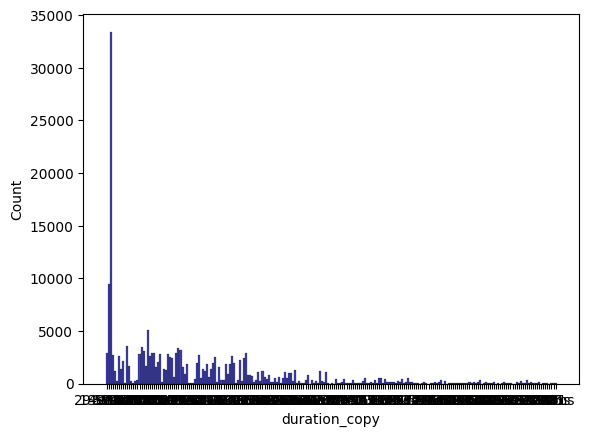

In [ ]:
import seaborn as sns
sns.histplot(df_final1['duration_copy'],bins=int(36),color='darkblue')
plt.show()

In [ ]:
bins1=[-1,1,50,80,100,120,150,200,315]
labels1=['1-50','51-80','81-100','101-120','121-150','151-200','201-315']
df_final1['duration_copy'] = pd.cut(df_final1['duration_copy'],bins=bins1,labels=labels1)
df_final1.head()

TypeError: '<' not supported between instances of 'int' and 'str'

In [ ]:
df_final1.loc[~df_final1['duration_copy'].str.contains('Season'),'duration']=df_final1.loc[~df_final['duration'].str.contains('Season'),'duration_copy']
df_final1.drop('duration_copy',axis=1,inplace=True)
df_final1.head()

In [ ]:
df_final1['duration'].value_counts()

,count
duration,
1 Season,33444
2 Seasons,9470
3 Seasons,5084
94,3591
97,3434
93,3356
95,3192
106,3052
90,2948


In [ ]:
from datetime import datetime
from dateutil.parser import parse
arr=[]
for i in df_final1['date_added'].values:
  dt1=parse(i)
  arr.append(dt1.strftime('%Y-%m-%d'))
df_final1['Modified_Added_date'] =arr
df_final1['Modified_Added_date']=pd.to_datetime(df_final1['Modified_Added_date'])
df_final1['month_added']=df_final1['Modified_Added_date'].dt.month
df_final1['week_Added']=df_final1['Modified_Added_date'].dt.isocalendar().week
df_final1['year']=df_final1['Modified_Added_date'].dt.year
df_final1.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90,90,2021-09-25,9,38,2021
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021


In [ ]:
df_final1['title']=df_final['title'].str.replace(r"\(.*\)","")
df_final1.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90,90,2021-09-25,9,38,2021
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021


In [ ]:
df_final1.groupby(['Genre']).agg({"title":"nunique"})

,title
Genre,
Anime Features,50
Children & Family Movies,36
Classic & Cult TV,6
Classic Movies,36
Comedies,464
Crime TV Shows,71
Cult Movies,59
Documentaries,40
Docuseries,174


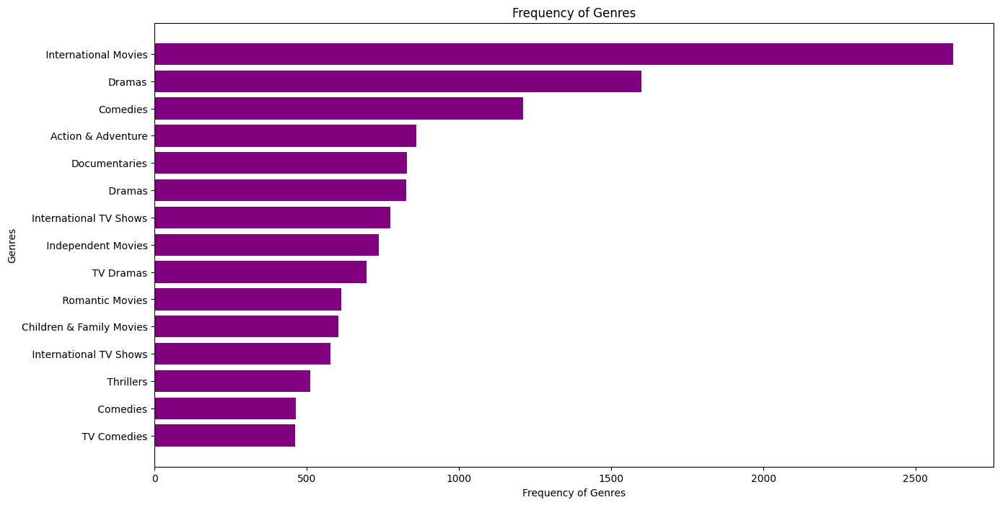

In [ ]:
df_genre = df_final1.groupby(['Genre']).agg({'title':'nunique'}).reset_index().sort_values('title',ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['Genre'],df_genre[::-1]['title'],color=['purple'])
plt.xlabel("Frequency of Genres")
plt.ylabel("Genres")
plt.title("Frequency of Genres")
plt.show()

In [ ]:
#identifying popular movies dramas and comedies

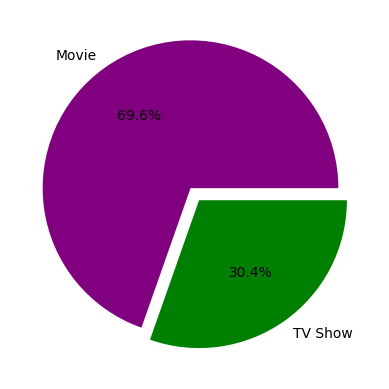

In [ ]:
df_type=df_final1.groupby(['type']).agg({"title":"nunique"}).reset_index()
plt.pie(df_type['title'],explode=(0.05,0.05),labels=df_type['type'],colors=['purple','green'],autopct='%.1f%%')
plt.show()

In [ ]:
#number of distinct titles on the basis of country
df_final1.groupby(['Country']).agg({'title':'nunique'})

,title
Country,
,7
Afghanistan,1
Albania,1
Algeria,3
Angola,1
Argentina,15
Armenia,1
Australia,43
Austria,3


In [ ]:
df_final1['Country'] = df_final1['Country'].str.replace(',', '')
df_final1.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90,90,2021-09-25,9,38,2021
1,Blood & Water,Ama Qamata,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
2,Blood & Water,Ama Qamata,Unknown Director,TV Dramas,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
3,Blood & Water,Ama Qamata,Unknown Director,TV Mysteries,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021
4,Blood & Water,Khosi Ngema,Unknown Director,International TV Shows,South Africa,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons,2021-09-24,9,38,2021


In [ ]:
df_final1.groupby(['Country']).agg({"title":"nunique"})

,title
Country,
,7
Afghanistan,1
Albania,1
Algeria,3
Angola,1
Argentina,15
Armenia,1
Australia,43
Austria,3


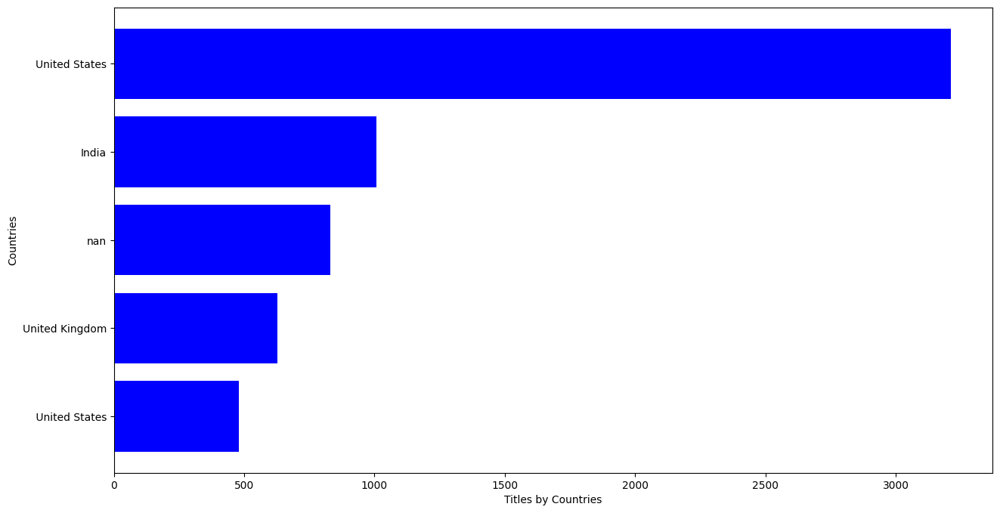

In [ ]:
df_country=df_final1.groupby(['Country']).agg({"title":"nunique"}).reset_index().sort_values('title',ascending=False)[:5]
plt.figure(figsize=(15,8))
plt.barh(df_country[::-1]['Country'],df_country[::-1]['title'],color=['blue'])
plt.xlabel("Titles by Countries")
plt.ylabel("Countries")
plt.show()

In [ ]:
df_final1.groupby(['rating']).agg({'title':'nunique'})

,title
rating,
G,41
NC-17,3
NR,87
PG,287
PG-13,490
R,799
TV-14,2160
TV-G,220
TV-MA,3207


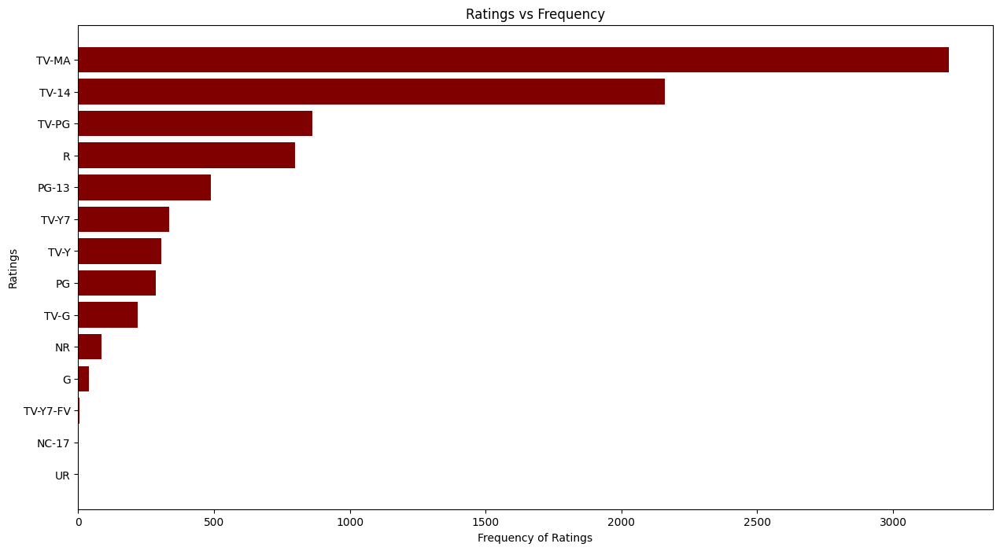

In [ ]:
df_rating=df_final1.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'],df_rating[::-1]['title'],color=['maroon'])
plt.xlabel("Frequency of Ratings")
plt.ylabel("Ratings")
plt.title("Ratings vs Frequency")
plt.show()

In [ ]:
df_final1.groupby(['duration']).agg({"title":"nunique"})

,title
duration,
1 Season,1793
10,1
10 Seasons,7
100,108
101,116
102,122
103,114
104,104
105,101


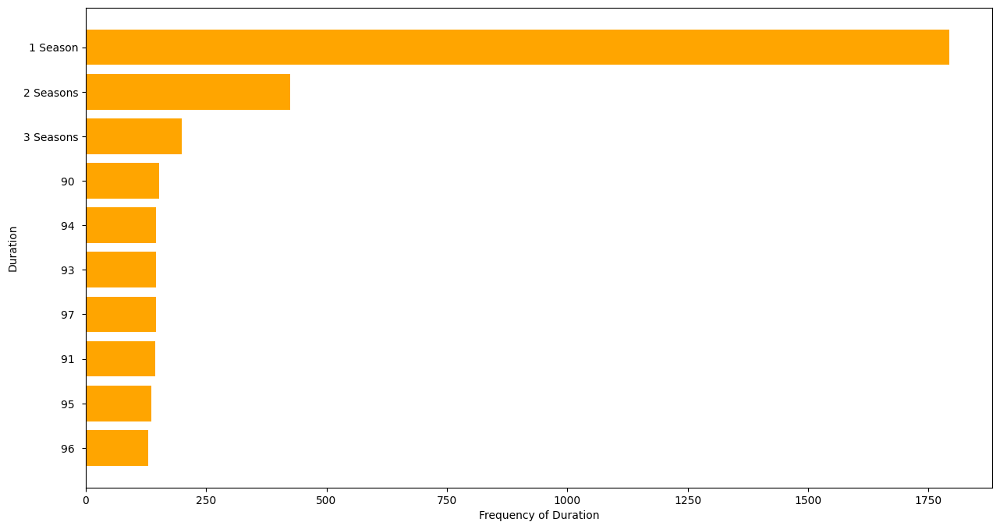

In [ ]:
df_duration=df_final1.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'],df_duration[::-1]['title'],color=['orange'])
plt.xlabel("Frequency of Duration")
plt.ylabel("Duration")
plt.show()

In [ ]:
df_final1.groupby(['Actors']).agg({"title":"nunique"})


,title
Actors,
Jr.,2
"""Riley"" Lakdhar Dridi",1
'Najite Dede,1
2 Chainz,1
2Mex,1
50 Cent,4
9m88,1
A Boogie Wit tha Hoodie,1
A. Murat Özgen,1


Text(0, 0.5, 'Actors')

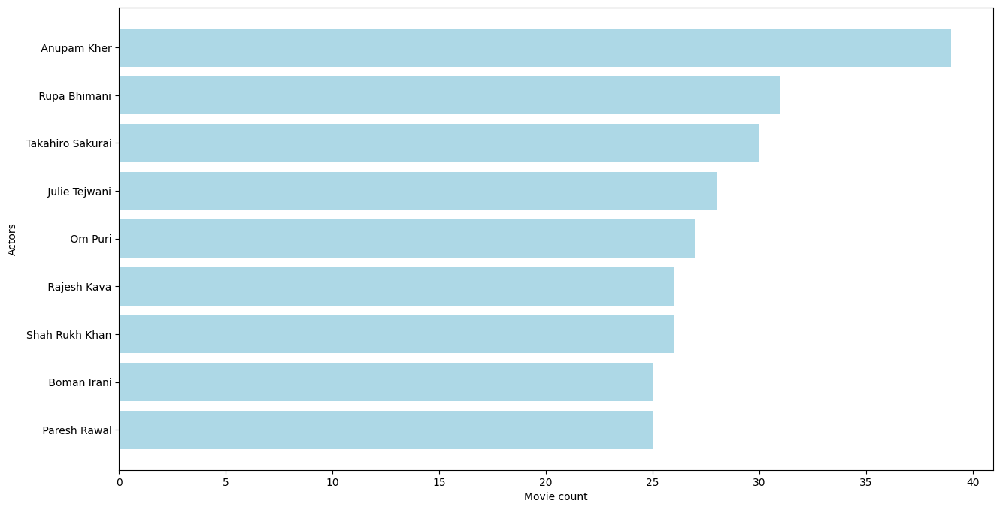

In [ ]:
#actor analysis graph
df_actor=df_final1.groupby(['Actors']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actor=df_actor[df_actor['Actors']!='Unknown Actor']
plt.figure(figsize=(15,8))
plt.barh(df_actor[::-1]['Actors'],df_actor[::-1]['title'],color=['lightblue'])
plt.xlabel("Movie count")
plt.ylabel("Actors")

In [ ]:
df_final1.groupby(['Directors']).agg({"title":"nunique"})

,title
Directors,
A. L. Vijay,2
A. Raajdheep,1
A. Salaam,1
A.R. Murugadoss,2
Aadish Keluskar,1
Aamir Bashir,1
Aamir Khan,1
Aanand Rai,1
Aaron Burns,1


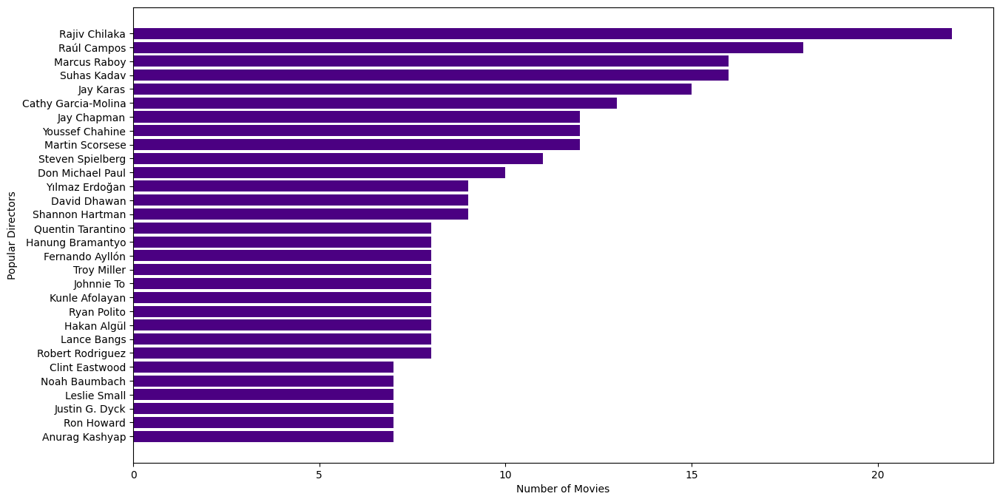

In [ ]:
df_director=df_final1.groupby(['Directors']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_director=df_director[df_director['Directors']!='Unknown Director']
plt.figure(figsize=(15,8))
plt.barh(df_director[::-1]['Directors'],df_director[::-1]['title'],color=['indigo'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

In [ ]:
df_final1.groupby(['year']).agg({'title':'nunique'})

,title
year,
2008,2
2009,2
2010,1
2011,13
2012,3
2013,11
2014,24
2015,82
2016,429


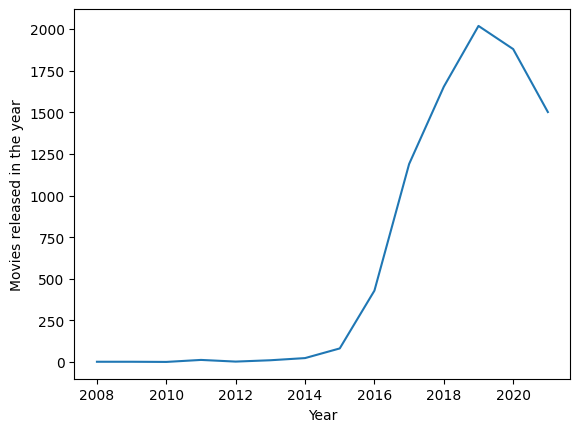

In [ ]:
df_year=df_final1.groupby(['year']).agg({'title':'nunique'}).reset_index()
sns.lineplot(data=df_year,x='year',y='title')
plt.ylabel("Movies released in the year")
plt.xlabel('Year')
plt.show()

In [ ]:
df_final1.groupby(['week_Added']).agg({'title':'nunique'})

,title
week_Added,
1,372
2,108
3,113
4,88
5,208
6,97
7,147
8,110
9,254


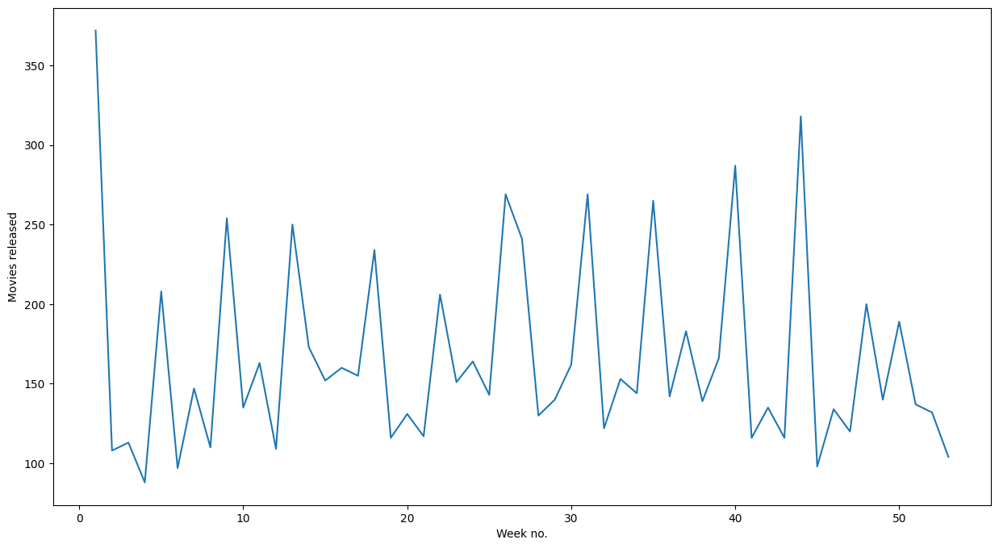

In [ ]:
df_week=df_final1.groupby(['week_Added']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week,x='week_Added',y='title')
plt.ylabel("Movies released")
plt.xlabel("Week no.")
plt.show()


In [ ]:
df_final1.groupby(['month_added']).agg({'title':'nunique'})

,title
month_added,
1,738
2,563
3,742
4,765
5,632
6,728
7,831
8,757
9,772


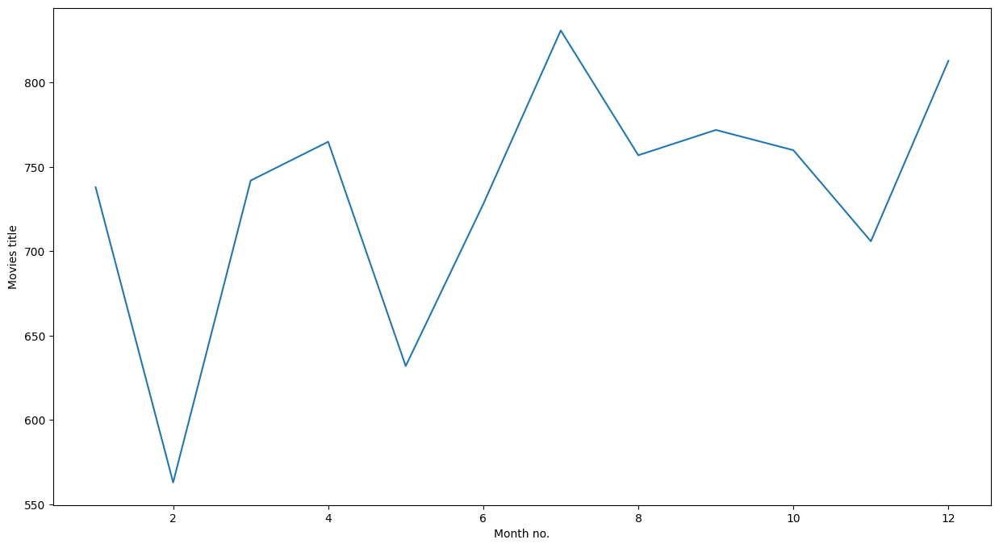

In [ ]:
df_month=df_final1.groupby(['month_added']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_month,x='month_added',y='title')
plt.xlabel("Month no.")
plt.ylabel("Movies title")
plt.show()

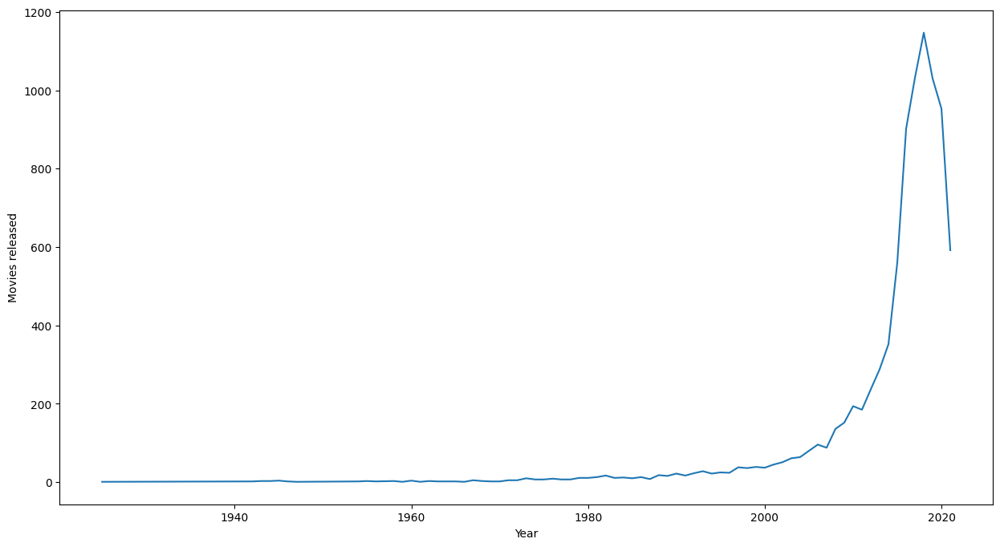

In [ ]:
df_release_year=df_final1.groupby(['release_year']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_release_year,x='release_year',y='title')
plt.ylabel("Movies released")
plt.xlabel("Year")
plt.show()

In [ ]:
df_shows=df_final1[df_final1['type']=='TV Show']
df_movies=df_final1[df_final1['type']=='Movie']


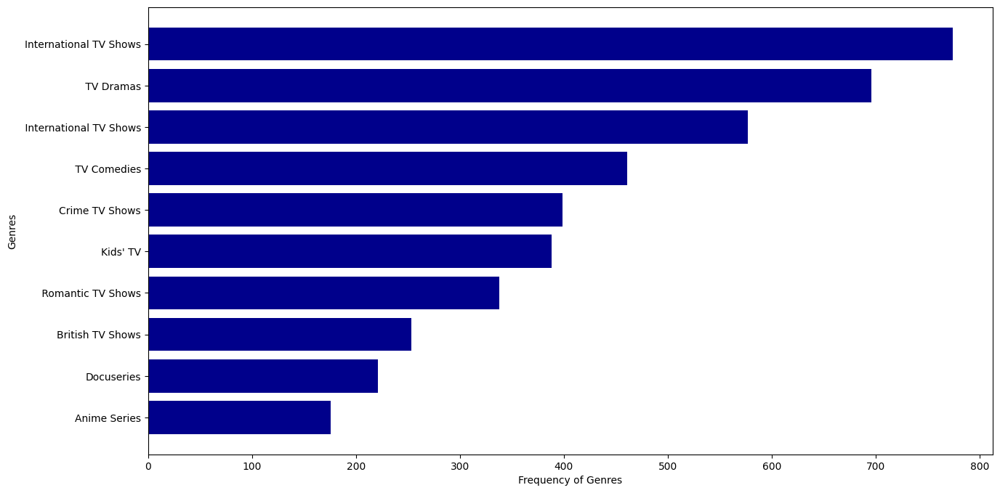

In [ ]:
df_genre=df_shows.groupby(['Genre']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['Genre'],df_genre[::-1]['title'],color=['darkblue'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

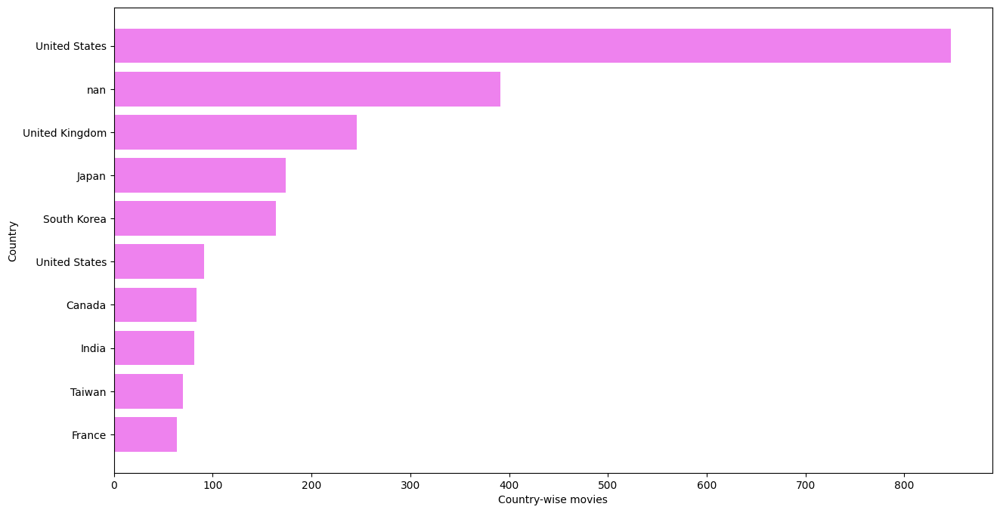

In [ ]:
df_cc=df_shows.groupby(['Country']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_cc[::-1]['Country'],df_cc[::-1]['title'],color=['violet'])
plt.xlabel('Country-wise movies')
plt.ylabel('Country')
plt.show()

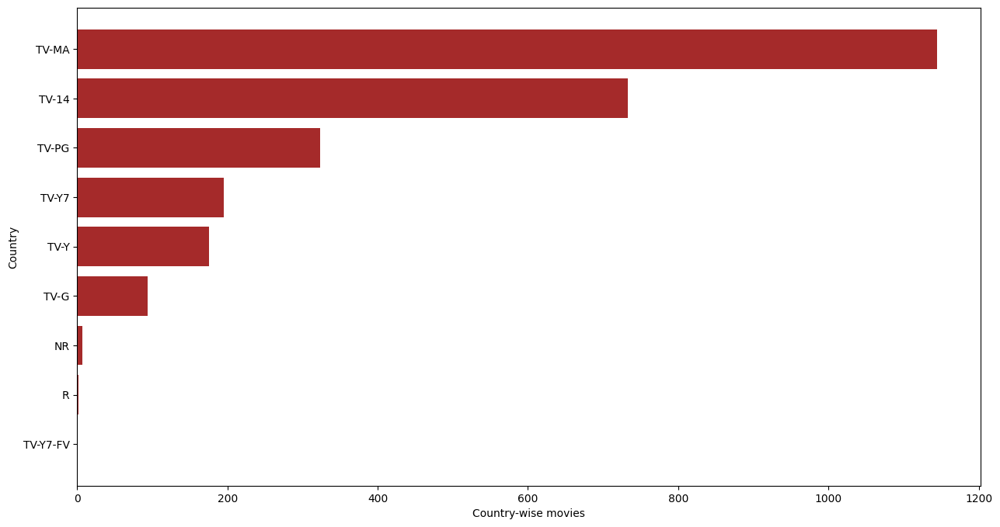

In [ ]:
df_rating=df_shows.groupby(['rating']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'],df_rating[::-1]['title'],color=['brown'])
plt.xlabel('Country-wise movies')
plt.ylabel('Country')
plt.show()

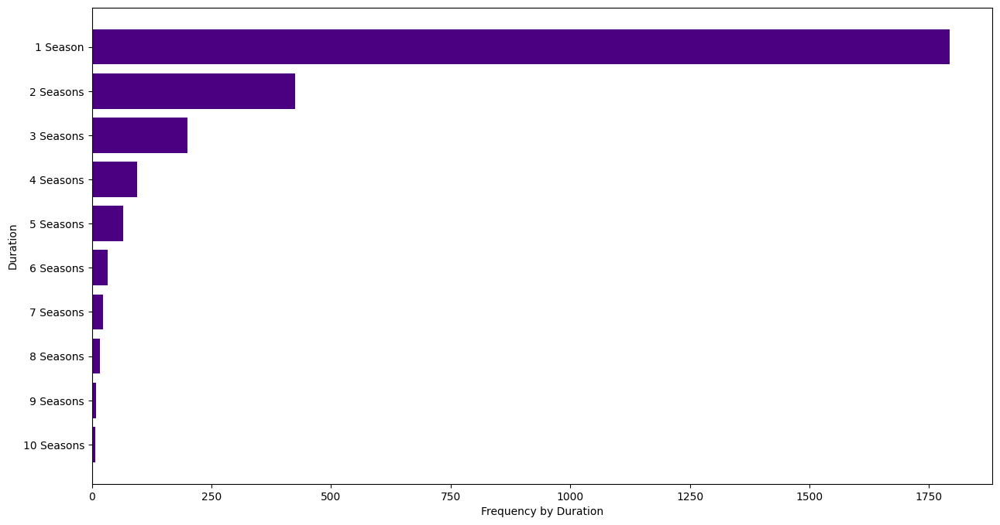

In [ ]:
df_duration=df_shows.groupby(['duration']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['indigo'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

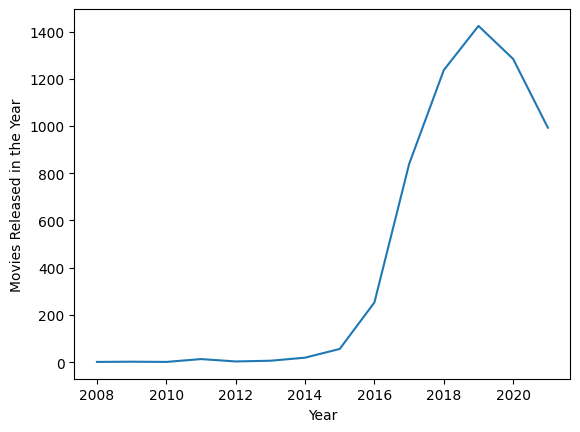

In [ ]:
df_year=df_movies.groupby(['year']).agg({'title':'nunique'}).reset_index()
sns.lineplot(data=df_year,x='year',y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel('Year')
plt.show()

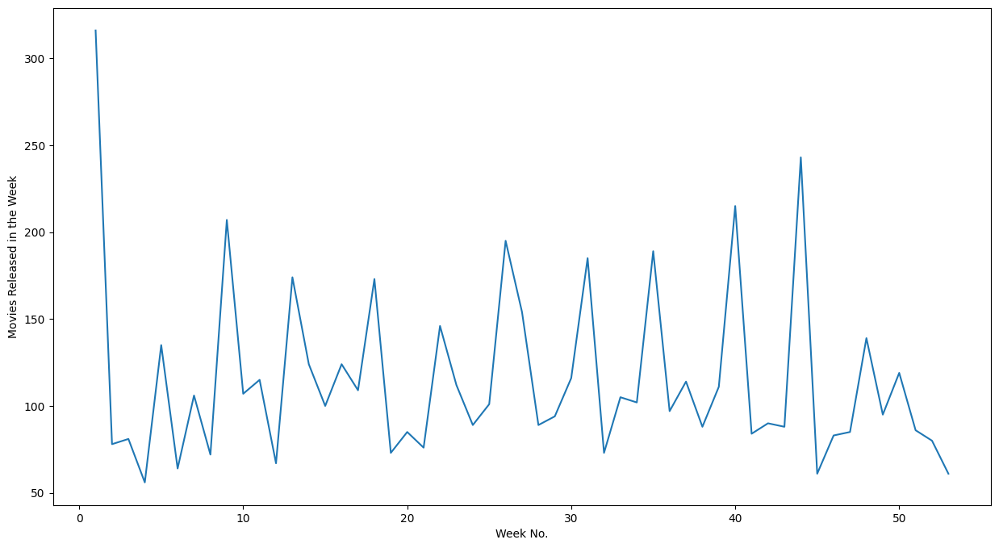

In [ ]:
df_week=df_movies.groupby(['week_Added']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week, x='week_Added', y='title')
plt.ylabel("Movies Released in the Week")
plt.xlabel("Week No.")
plt.show()

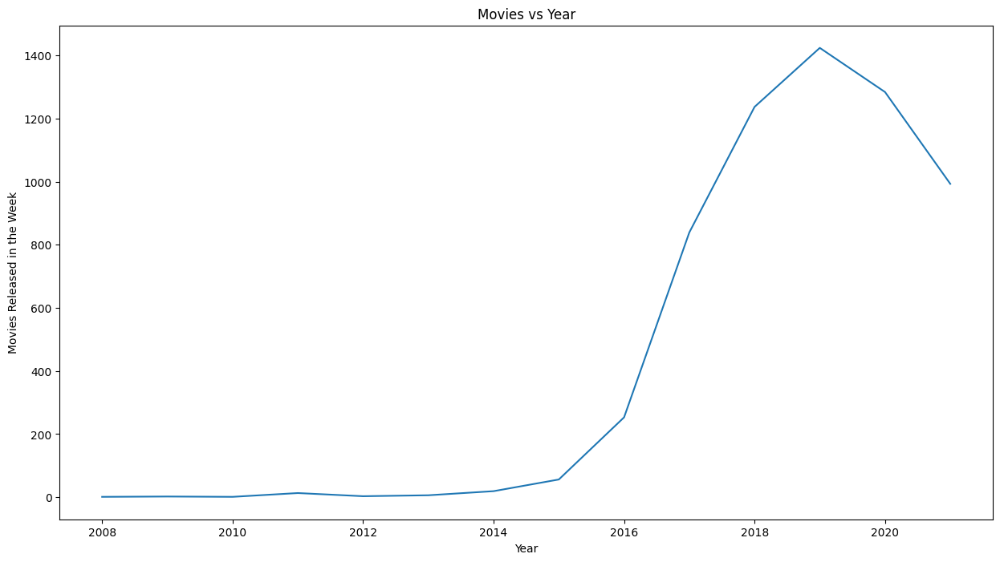

In [ ]:
df_year=df_movies.groupby(['year']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Week")
plt.xlabel("Year")
plt.title("Movies vs Year")
plt.show()

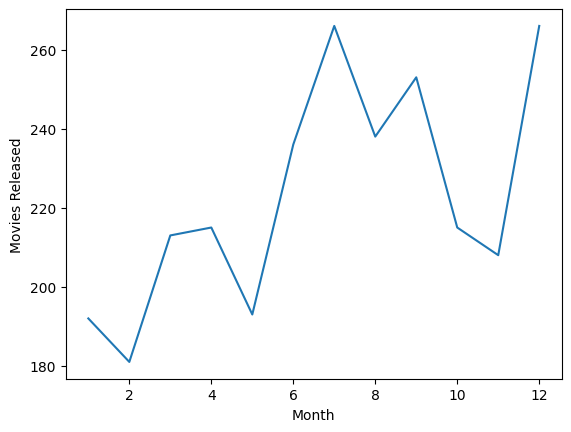

In [ ]:
df_ms=df_shows.groupby(by=['month_added']).agg({'title':'nunique'}).reset_index()
sns.lineplot(data=df_ms,x='month_added',y='title')
plt.xlabel('Month')
plt.ylabel('Movies Released')
plt.show()

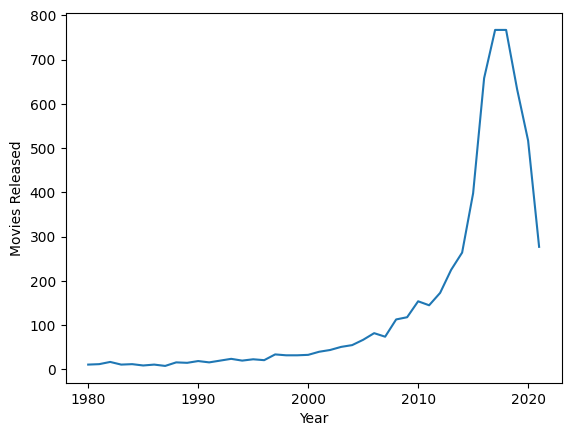

In [ ]:
df_r_year=df_movies[df_movies['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_r_year,x='release_year',y='title')
plt.xlabel('Year')
plt.ylabel('Movies Released')
plt.show()

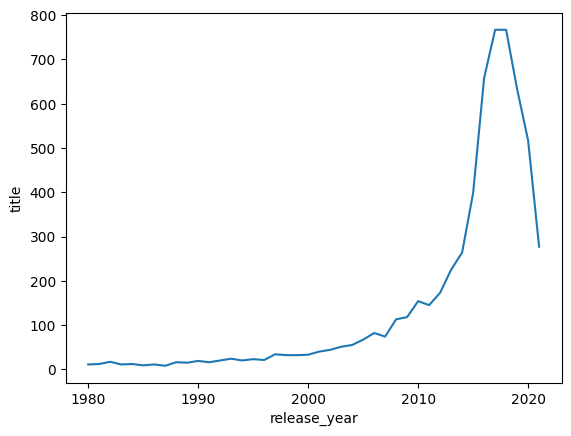

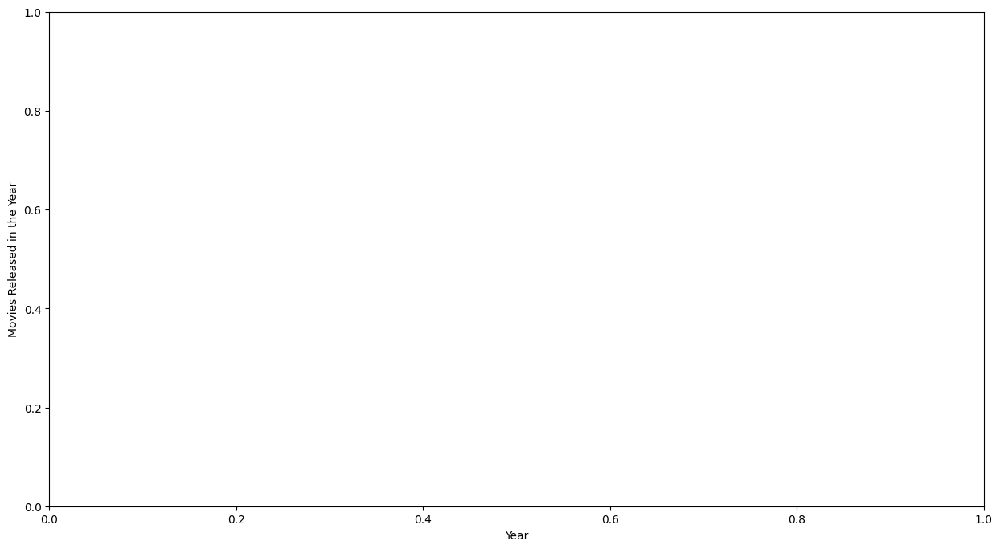

In [ ]:
df_release_year=df_movies[df_movies['release_year']>=1980].groupby(['release_year']).agg({'title':'nunique'}).reset_index()
sns.lineplot(data=df_release_year,x='release_year',y='title')
plt.figure(figsize=(15,8))
plt.ylabel("Movies Released in the Year")
plt.xlabel('Year')
plt.show()


## Questions to be Explored Now for Recommendations


1) So this time, the granularity level is country and analysis of TV Shows/Movies the country brings. I am going to consider only the top countries individually for TV Shows and Movies. There are definitely some common countries too which bring out quality content in both TV Shows and Movies.

2) Which Genres do these countries offer and what are the intended audiences(Ratings) which are popular in Netflix?

3)In case of Movies, what is the duration/length of movies which makes them special and depicts attention span?

4)Who are the popular actors/directors across TV Shows and Movies in these countries?

5)In what time of the year, people tend to watch movies and shows in these countries?

6)Popular Actor and Director Combinations in these countries

In [ ]:
#below countries will be analyzed for both shows and movies
shows_and_movies = ['United States','India','United Kingdom','Canada','Japan']
only_show = ['Japan','South Korea']

In [ ]:
df_usa_shows = df_final1[df_final1['Country']=='United States'][df_final1[df_final1['Country']=='United States']['type']=='TV Show']
df_usa_movies = df_final1[df_final1['Country']=='United States'][df_final1[df_final1['Country']=='United States']['type']=='Movie']

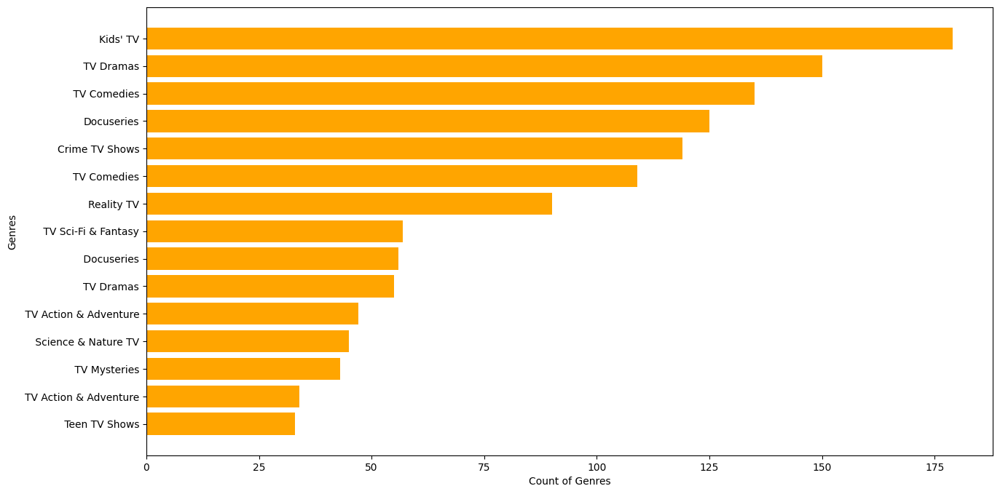

In [ ]:
df_genre=df_usa_shows.groupby(['Genre']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['Genre'],df_genre[::-1]['title'],color=['orange'])
plt.xlabel('Count of Genres')
plt.ylabel('Genres')
plt.show()

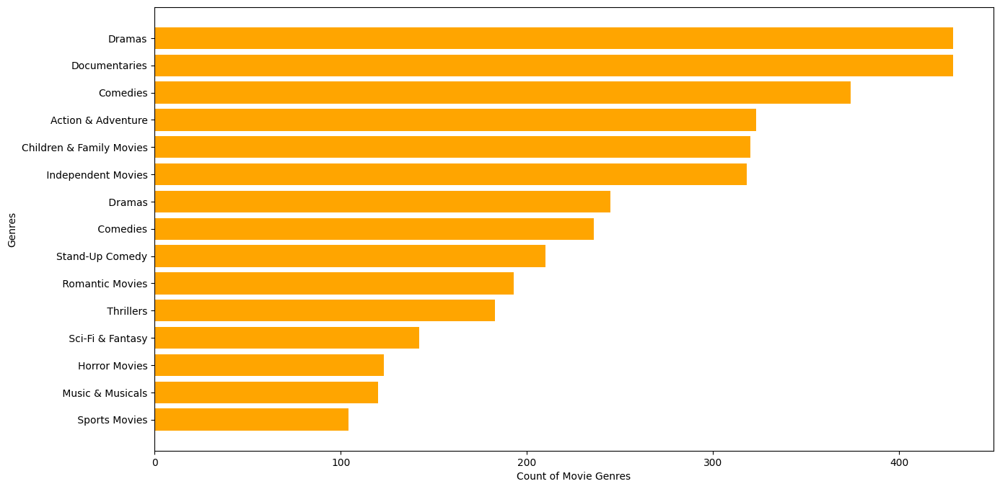

In [ ]:
df_genre=df_usa_movies.groupby(['Genre']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['Genre'],df_genre[::-1]['title'],color=['orange'])
plt.xlabel('Count of Movie Genres')
plt.ylabel('Genres')
plt.show()

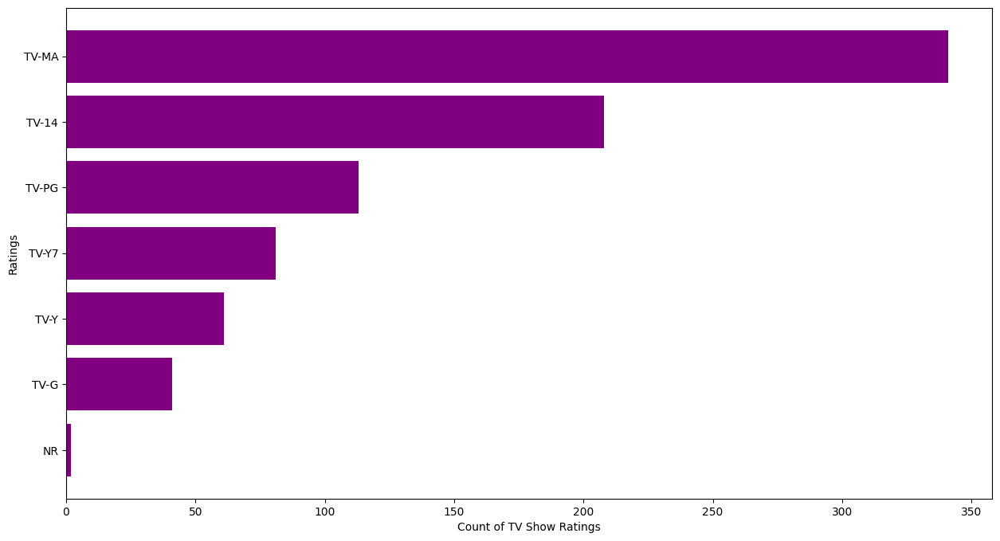

In [ ]:
df_rating = df_usa_shows.groupby(['rating']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'],df_rating[::-1]['title'],color=['purple'])
plt.xlabel('Count of TV Show Ratings')
plt.ylabel('Ratings')
plt.show()

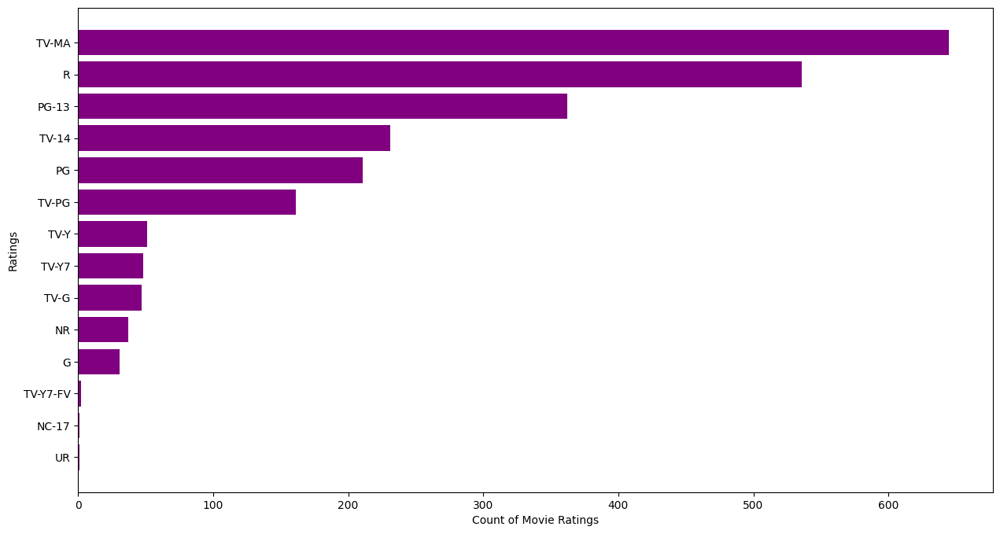

In [ ]:
df_rating = df_usa_movies.groupby(['rating']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'],df_rating[::-1]['title'],color=['purple'])
plt.xlabel('Count of Movie Ratings')
plt.ylabel('Ratings')
plt.show()

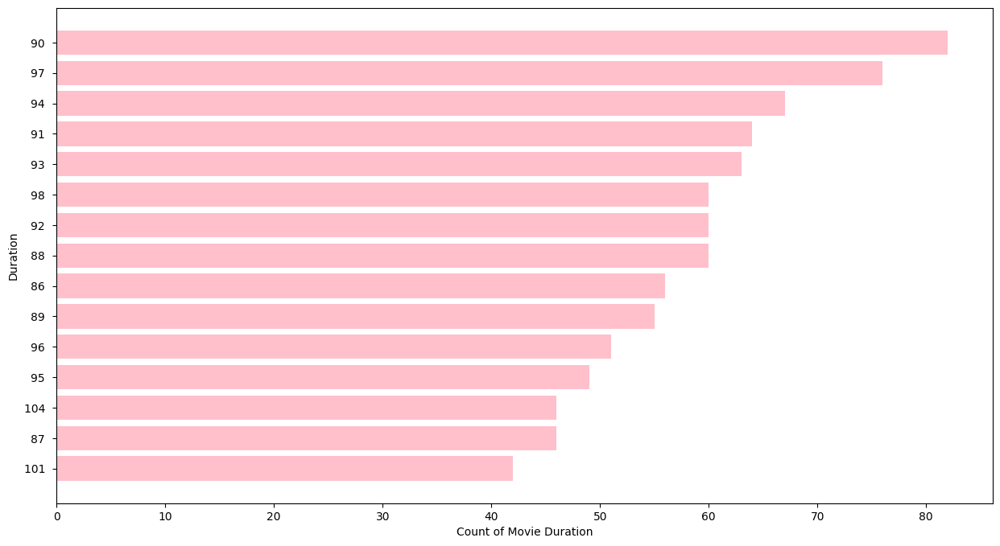

In [ ]:
df_duration = df_usa_movies.groupby(['duration']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'],df_duration[::-1]['title'],color='pink')
plt.xlabel('Count of Movie Duration')
plt.ylabel('Duration')
plt.show()

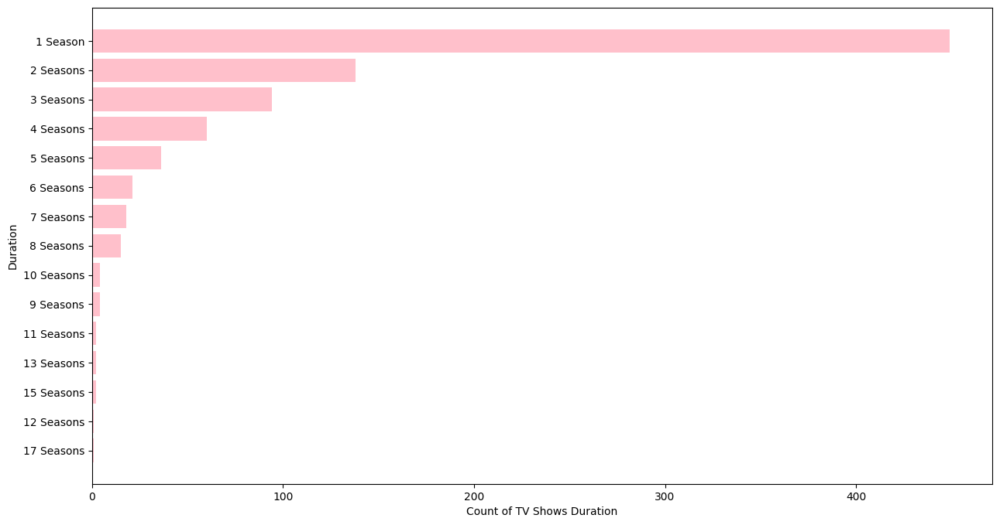

In [ ]:
df_duration = df_usa_shows.groupby(['duration']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'],df_duration[::-1]['title'],color='pink')
plt.xlabel('Count of TV Shows Duration')
plt.ylabel('Duration')
plt.show()

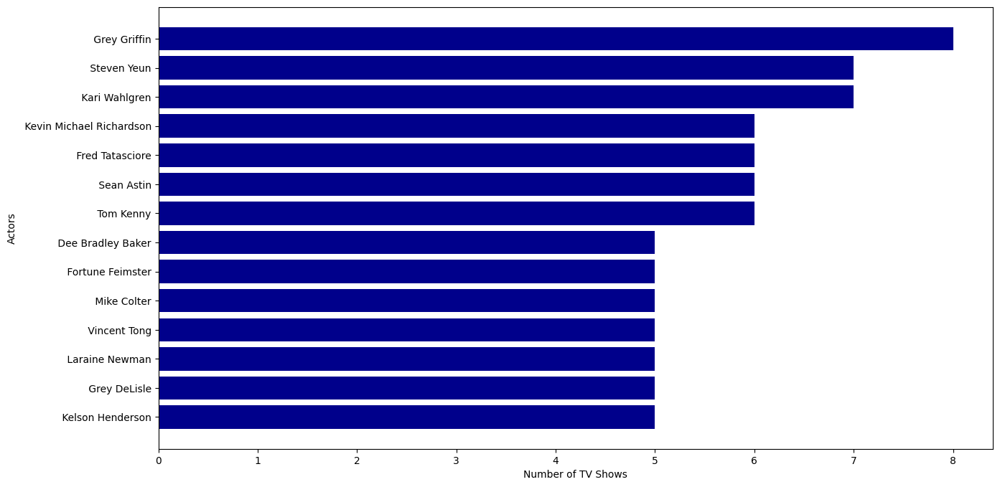

In [ ]:
df_actors=df_usa_shows.groupby(['Actors']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_actors=df_actors[df_actors['Actors']!='Unknown Actor']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['Actors'],df_actors[::-1]['title'],color=['darkblue'])
plt.xlabel('Number of TV Shows')
plt.ylabel('Actors')
plt.show()

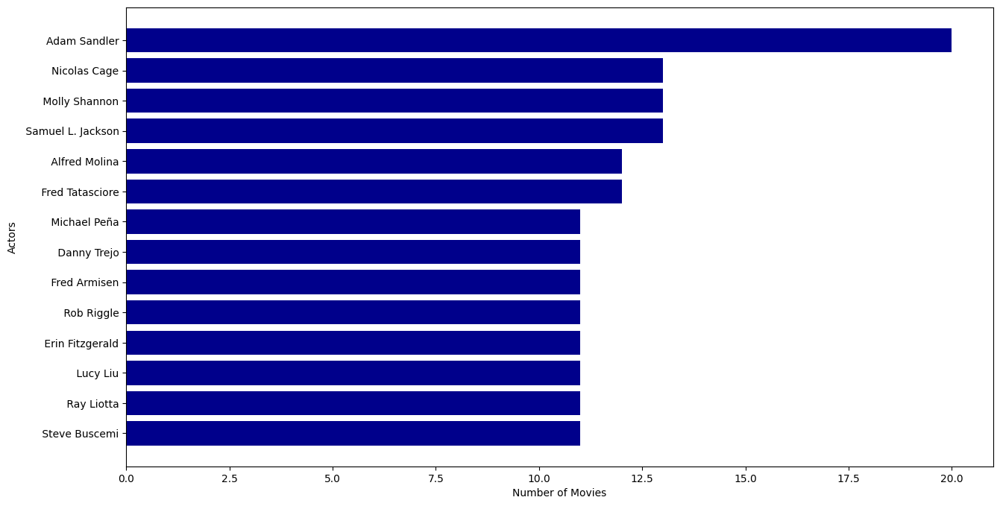

In [ ]:
df_actors=df_usa_movies.groupby(['Actors']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_actors=df_actors[df_actors['Actors']!='Unknown Actor']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['Actors'],df_actors[::-1]['title'],color=['darkblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Actors')
plt.show()

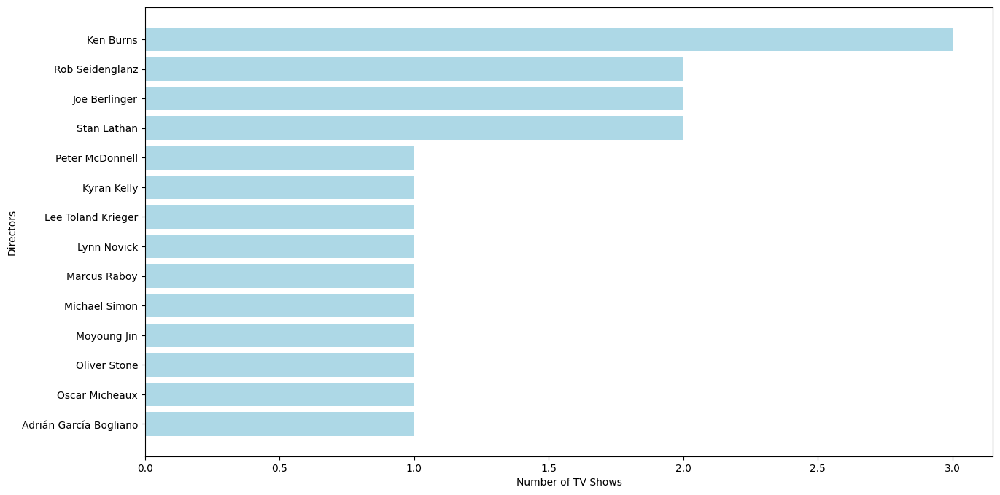

In [ ]:
df_directors=df_usa_shows.groupby(['Directors']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_directors=df_directors[df_directors['Directors']!='Unknown Director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['Directors'],df_directors[::-1]['title'],color=['lightblue'])
plt.xlabel('Number of TV Shows')
plt.ylabel('Directors')
plt.show()

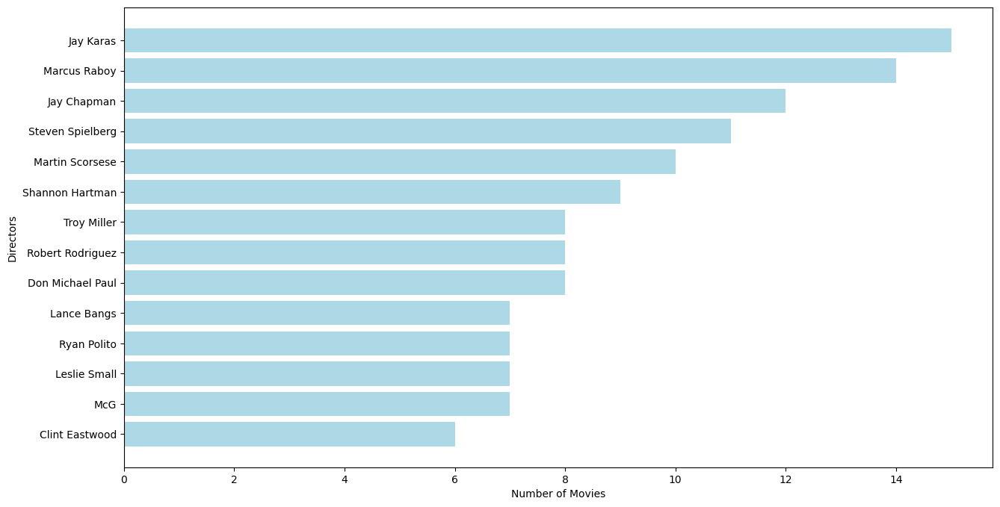

In [ ]:
df_directors=df_usa_movies.groupby(['Directors']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_directors=df_directors[df_directors['Directors']!='Unknown Director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['Directors'],df_directors[::-1]['title'],color=['lightblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Directors')
plt.show()

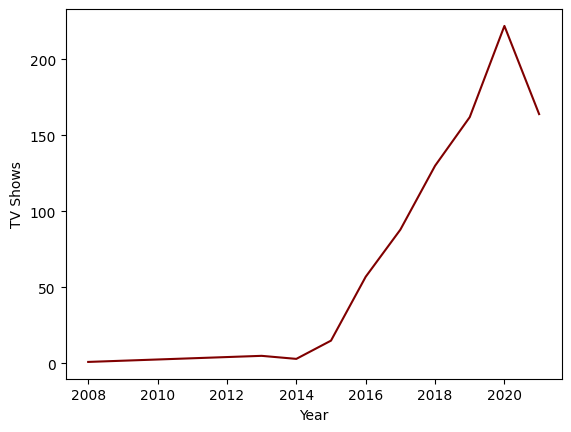

In [ ]:
df_year = df_usa_shows.groupby(['year']).agg({'title':'nunique'}).reset_index()
sns.lineplot(data=df_year,x='year',y='title',color='maroon')
plt.xlabel('Year')
plt.ylabel('TV Shows')
plt.show()

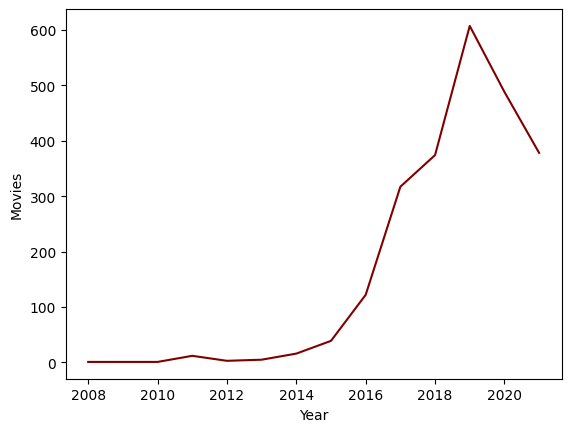

In [ ]:
df_year=df_usa_movies.groupby(['year']).agg({'title':'nunique'}).reset_index()
sns.lineplot(data=df_year,x='year',y='title',color='maroon')
plt.xlabel('Year')
plt.ylabel('Movies')
plt.show()

Text(0.5, 0, 'Week no')

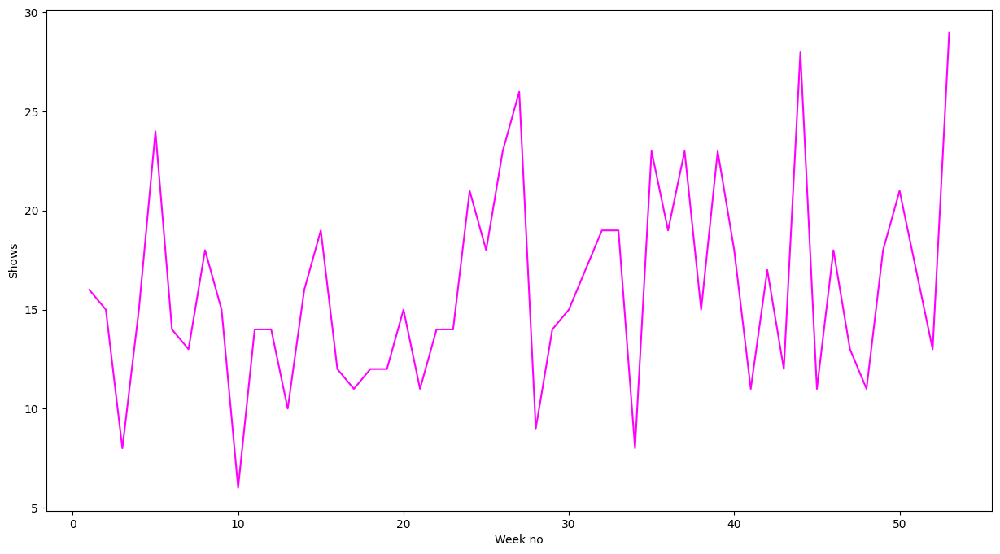

In [ ]:
df_week=df_usa_shows.groupby(['week_Added']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week,x='week_Added',y='title',color='magenta')
plt.ylabel('Shows')
plt.xlabel('Week no')

Text(0.5, 0, 'Week no')

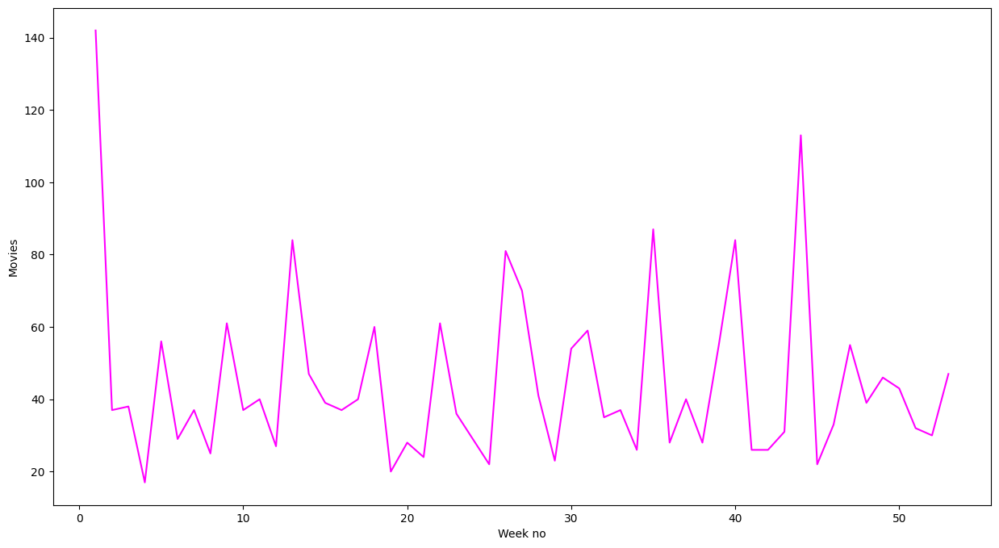

In [ ]:
df_week=df_usa_movies.groupby(['week_Added']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week,x='week_Added',y='title',color='magenta')
plt.ylabel('Movies')
plt.xlabel('Week no')

Text(0.5, 0, 'Month no')

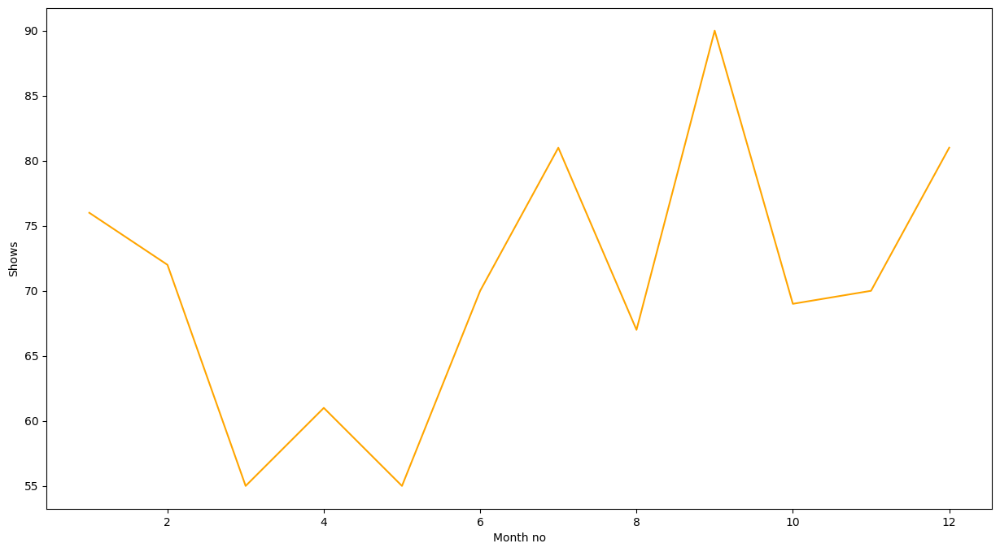

In [ ]:
df_month=df_usa_shows.groupby(['month_added']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_month,x='month_added',y='title',color='orange')
plt.ylabel('Shows')
plt.xlabel('Month no')

Text(0.5, 0, 'Month no')

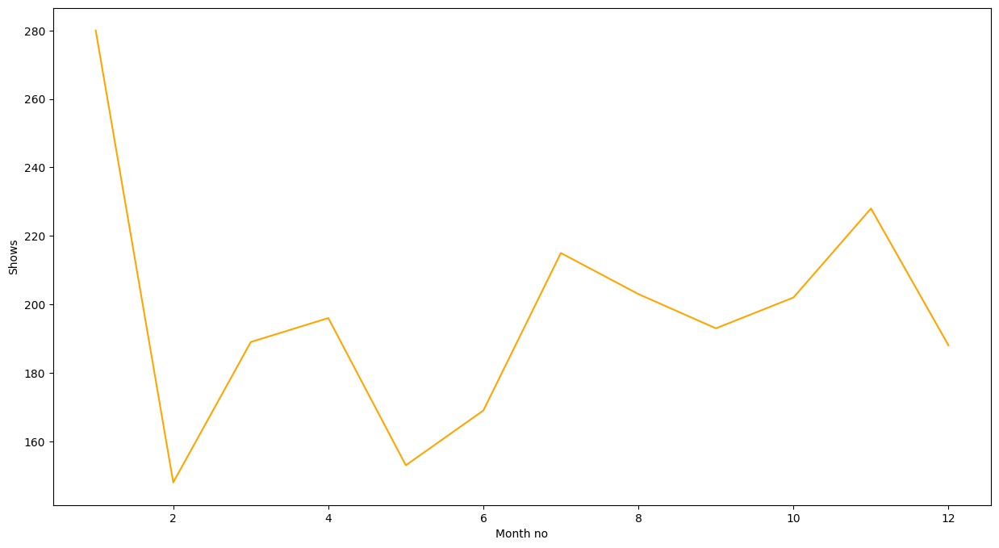

In [ ]:
df_month=df_usa_movies.groupby(['month_added']).agg({'title':'nunique'}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_month,x='month_added',y='title',color='orange')
plt.ylabel('Shows')
plt.xlabel('Month no')

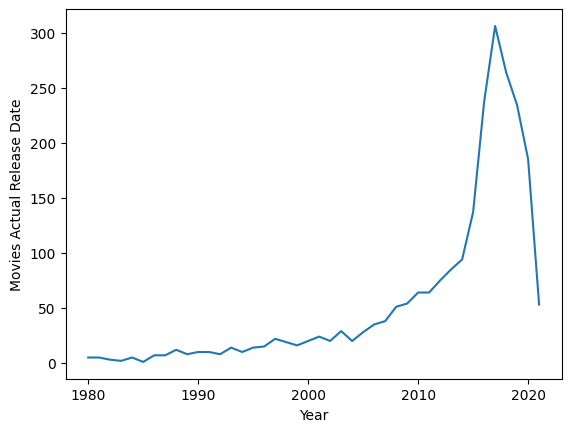

In [ ]:
df_release_year=df_usa_movies[df_usa_movies['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

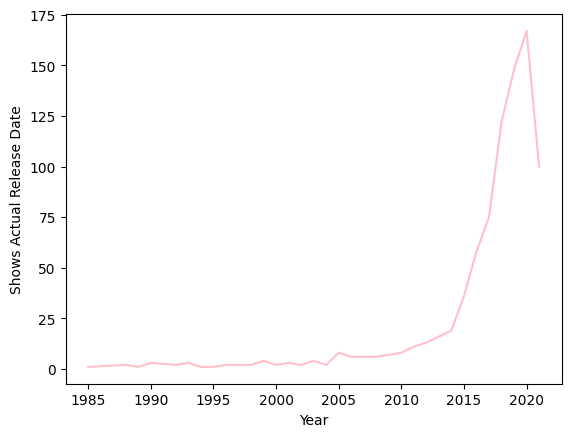

In [ ]:
df_release_year=df_usa_shows[df_usa_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title',color='pink')
plt.ylabel("Shows Actual Release Date")
plt.xlabel("Year")
plt.show()

In [ ]:
df_usa_movies.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Unknown Actor,Kirsten Johnson,Documentaries,United States,s1,Movie,"September 25, 2021",2020,PG-13,90,90,2021-09-25,9,38,2021
169,Sankofa,Kofi Ghanaba,Haile Gerima,Dramas,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021
175,Sankofa,Kofi Ghanaba,Haile Gerima,Independent Movies,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021
181,Sankofa,Kofi Ghanaba,Haile Gerima,International Movies,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021
187,Sankofa,Oyafunmike Ogunlano,Haile Gerima,Dramas,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021


In [ ]:
df_usa_movies['Actor_Director_Combination'] = df_usa_movies.Actors.str.cat(df_usa_movies.Directors, sep=' and ')
df_usa_movies_subset = df_usa_movies[df_usa_movies['Actors']!='Unknown Actor']
df_usa_movies_subset = df_usa_movies_subset[df_usa_movies_subset['Directors']!='Unknown Director']
df_usa_movies_subset.head()


,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
169,Sankofa,Kofi Ghanaba,Haile Gerima,Dramas,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021,Kofi Ghanaba and Haile Gerima
175,Sankofa,Kofi Ghanaba,Haile Gerima,Independent Movies,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021,Kofi Ghanaba and Haile Gerima
181,Sankofa,Kofi Ghanaba,Haile Gerima,International Movies,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021,Kofi Ghanaba and Haile Gerima
187,Sankofa,Oyafunmike Ogunlano,Haile Gerima,Dramas,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021,Oyafunmike Ogunlano and Haile Gerima
193,Sankofa,Oyafunmike Ogunlano,Haile Gerima,Independent Movies,United States,s8,Movie,"September 24, 2021",1993,TV-MA,125,125,2021-09-24,9,38,2021,Oyafunmike Ogunlano and Haile Gerima


In [ ]:
df_usa_shows['Actor_Director_Combo'] = df_usa_shows.Actors.str.cat(df_usa_shows.Directors, sep=' and ')
df_usa_shows_subset = df_usa_shows[df_usa_shows['Actors']!='Unknown Actor']
df_usa_shows_subset = df_usa_shows_subset[df_usa_shows_subset['Directors']!='Unknown Director']
df_usa_shows_subset.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combo
8733,The Flash,Grant Gustin,Glen Winter,Crime TV Shows,United States,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,7 Seasons,2021-07-28,7,30,2021,Grant Gustin and Glen Winter
8734,The Flash,Grant Gustin,Glen Winter,TV Action & Adventure,United States,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,7 Seasons,2021-07-28,7,30,2021,Grant Gustin and Glen Winter
8735,The Flash,Grant Gustin,Glen Winter,TV Sci-Fi & Fantasy,United States,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,7 Seasons,2021-07-28,7,30,2021,Grant Gustin and Glen Winter
8736,The Flash,Candice Patton,Glen Winter,Crime TV Shows,United States,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,7 Seasons,2021-07-28,7,30,2021,Candice Patton and Glen Winter
8737,The Flash,Candice Patton,Glen Winter,TV Action & Adventure,United States,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,7 Seasons,2021-07-28,7,30,2021,Candice Patton and Glen Winter


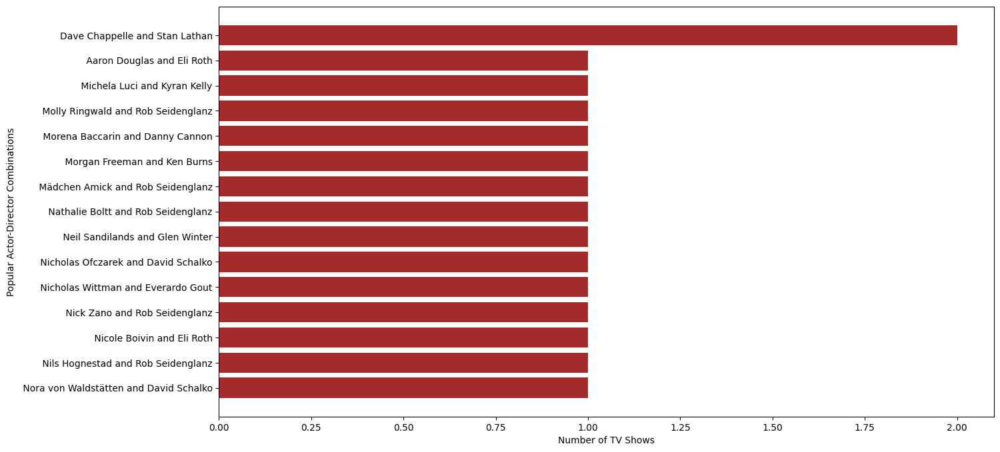

In [ ]:
df_ad=df_usa_shows_subset.groupby(['Actor_Director_Combo']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_ad[::-1]['Actor_Director_Combo'],df_ad[::-1]['title'],color=['brown'])
plt.xlabel('Number of TV Shows')
plt.ylabel('Popular Actor-Director Combinations')
plt.show()



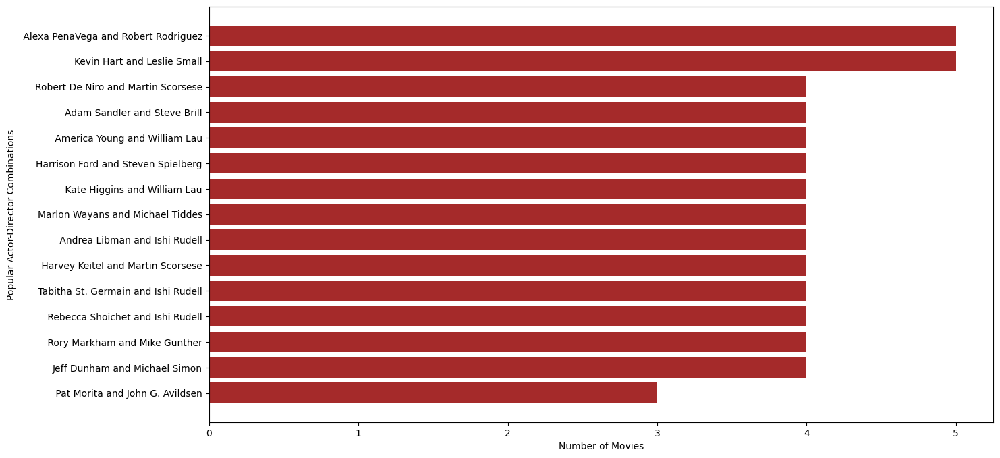

In [ ]:
df_ad=df_usa_movies_subset.groupby(['Actor_Director_Combination']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_ad[::-1]['Actor_Director_Combination'],df_ad[::-1]['title'],color=['brown'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actor-Director Combinations')
plt.show()

In [ ]:
df_ad[::-1]['Actor_Director_Combination'].values

array([' Pat Morita and John G. Avildsen',
       'Jeff Dunham and Michael Simon', ' Rory Markham and Mike Gunther',
       ' Rebecca Shoichet and Ishi Rudell',
       ' Tabitha St. Germain and Ishi Rudell',
       ' Harvey Keitel and Martin Scorsese',
       ' Andrea Libman and Ishi Rudell',
       'Marlon Wayans and Michael Tiddes',
       ' Kate Higgins and William Lau',
       'Harrison Ford and Steven Spielberg',
       ' America Young and William Lau', 'Adam Sandler and Steve Brill',
       'Robert De Niro and Martin Scorsese',
       'Kevin Hart and Leslie Small',
       ' Alexa PenaVega and Robert Rodriguez'], dtype=object)

Univariate analaysis for shows and movies in india

In [ ]:
df_india_shows=df_final1[df_final1['Country']=='India'][df_final1[df_final1['Country']=='India']['type']=='TV Show']
df_india_movies=df_final1[df_final1['Country']=='India'][df_final1[df_final1['Country']=='India']['type']=='Movie']

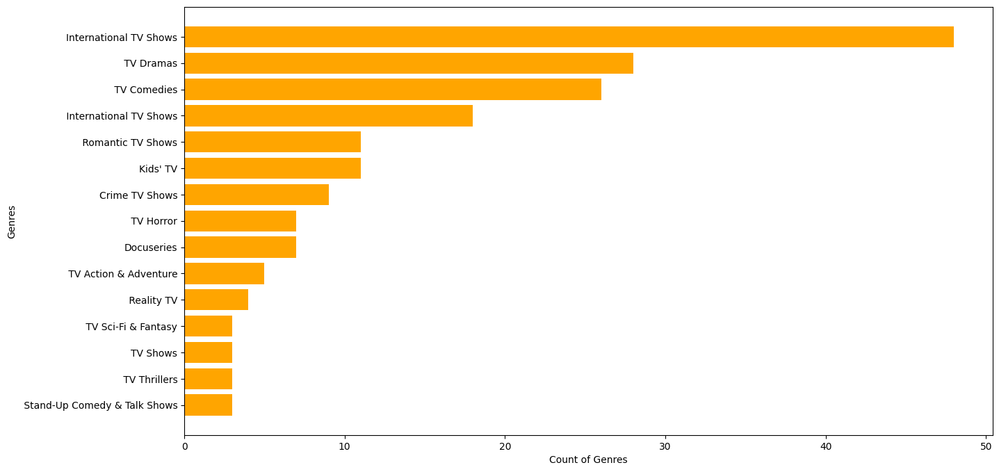

In [ ]:
df_genre = df_india_shows.groupby(['Genre']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['Genre'],df_genre[::-1]['title'],color=['orange'])
plt.xlabel('Count of Genres')
plt.ylabel('Genres')
plt.show()

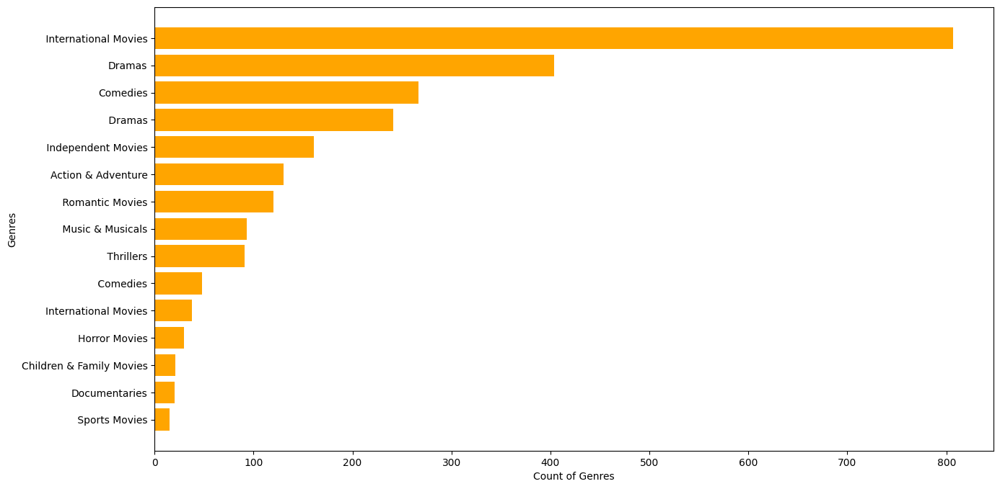

In [ ]:
df_genre = df_india_movies.groupby(['Genre']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['Genre'],df_genre[::-1]['title'],color=['orange'])
plt.xlabel('Count of Genres')
plt.ylabel('Genres')
plt.show()

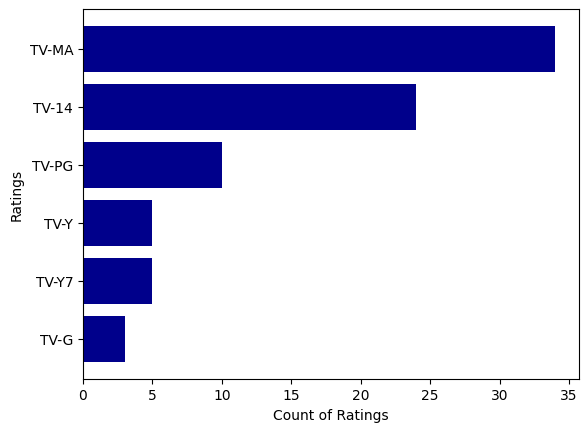

In [ ]:
df_rating = df_india_shows.groupby(['rating']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
plt.barh(df_rating[::-1]['rating'],df_rating[::-1]['title'],color=['darkblue'])
plt.xlabel('Count of Ratings')
plt.ylabel('Ratings')
plt.show()

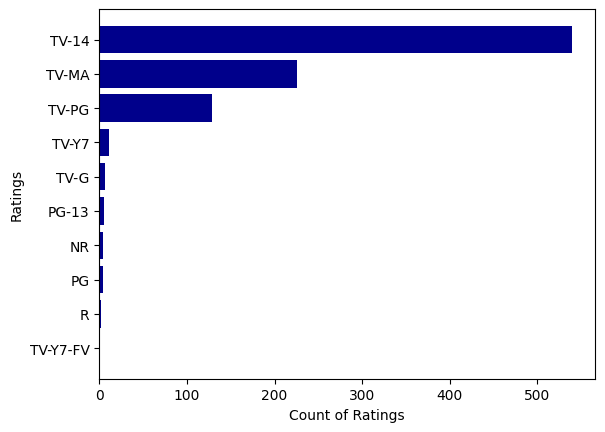

In [ ]:
df_rating = df_india_movies.groupby(['rating']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
plt.barh(df_rating[::-1]['rating'],df_rating[::-1]['title'],color=['darkblue'])
plt.xlabel('Count of Ratings')
plt.ylabel('Ratings')
plt.show()

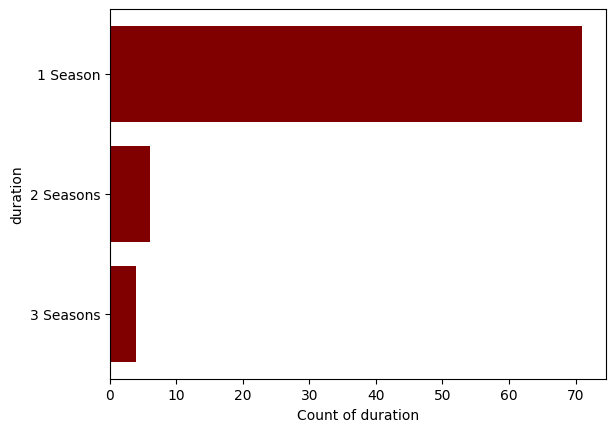

In [ ]:
df_rating = df_india_shows.groupby(['duration']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
plt.barh(df_rating[::-1]['duration'],df_rating[::-1]['title'],color=['maroon'])
plt.xlabel('Count of duration')
plt.ylabel('duration')
plt.show()

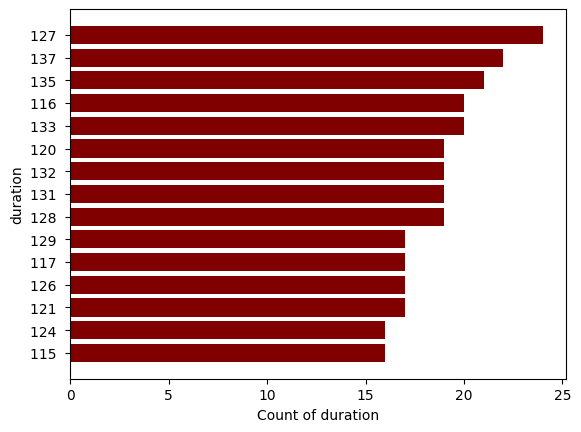

In [ ]:
df_rating = df_india_movies.groupby(['duration']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
plt.barh(df_rating[::-1]['duration'],df_rating[::-1]['title'],color=['maroon'])
plt.xlabel('Count of duration')
plt.ylabel('duration')
plt.show()

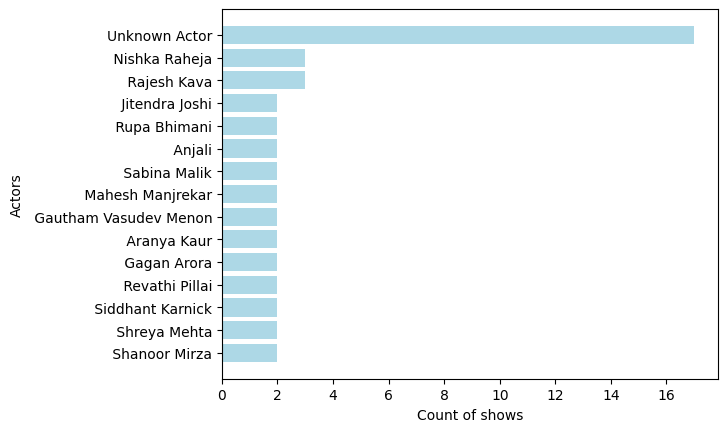

In [ ]:
df_actors = df_india_shows.groupby(['Actors']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
plt.barh(df_actors[::-1]['Actors'],df_actors[::-1]['title'],color=['lightblue'])
plt.xlabel('Count of shows')
plt.ylabel('Actors')
plt.show()

In [ ]:
df_actors.values

array([['Unknown Actor', 17],
       [' Nishka Raheja', 3],
       [' Rajesh Kava', 3],
       [' Jitendra Joshi', 2],
       [' Rupa Bhimani', 2],
       [' Anjali', 2],
       [' Sabina Malik', 2],
       [' Mahesh Manjrekar', 2],
       [' Gautham Vasudev Menon', 2],
       [' Aranya Kaur', 2],
       [' Gagan Arora', 2],
       [' Revathi Pillai', 2],
       [' Siddhant Karnick', 2],
       [' Shreya Mehta', 2],
       [' Shanoor Mirza', 2]], dtype=object)

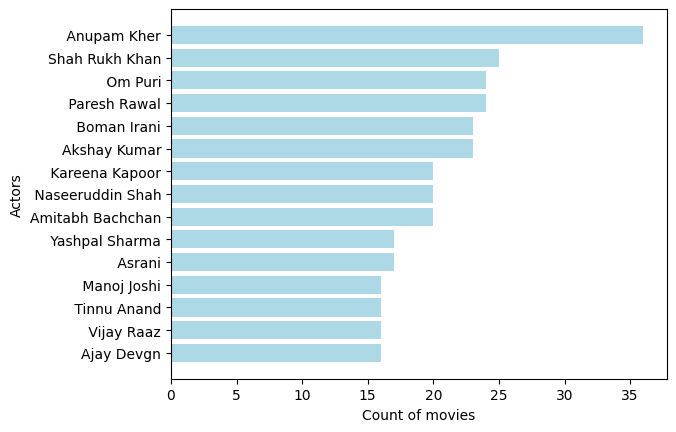

In [ ]:
df_actors = df_india_movies.groupby(['Actors']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
plt.barh(df_actors[::-1]['Actors'],df_actors[::-1]['title'],color=['lightblue'])
plt.xlabel('Count of movies')
plt.ylabel('Actors')
plt.show()

In [ ]:
df_actors.values

array([[' Anupam Kher', 36],
       ['Shah Rukh Khan', 25],
       [' Om Puri', 24],
       [' Paresh Rawal', 24],
       [' Boman Irani', 23],
       ['Akshay Kumar', 23],
       [' Kareena Kapoor', 20],
       [' Naseeruddin Shah', 20],
       ['Amitabh Bachchan', 20],
       [' Yashpal Sharma', 17],
       [' Asrani', 17],
       [' Manoj Joshi', 16],
       [' Tinnu Anand', 16],
       [' Vijay Raaz', 16],
       ['Ajay Devgn', 16]], dtype=object)

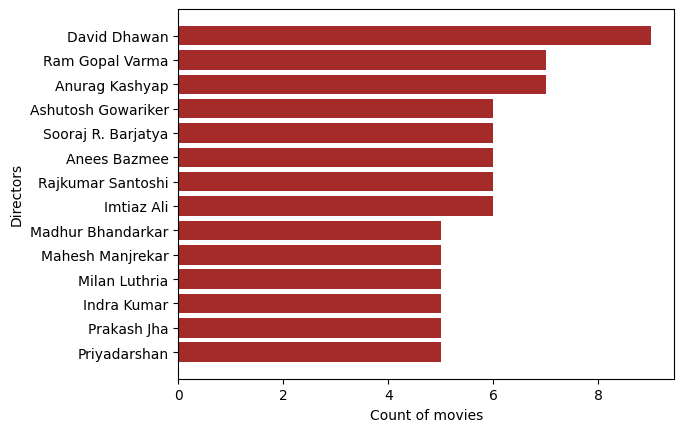

In [ ]:
df_directors = df_india_movies.groupby(['Directors']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
df_directors=df_directors[df_directors['Directors']!='Unknown Director']
plt.barh(df_directors[::-1]['Directors'],df_directors[::-1]['title'],color=['brown'])
plt.xlabel('Count of movies')
plt.ylabel('Directors')
plt.show()

In [ ]:
df_directors

,Directors,title
137,David Dhawan,9
425,Ram Gopal Varma,7
74,Anurag Kashyap,7
92,Ashutosh Gowariker,6
550,Sooraj R. Barjatya,6
61,Anees Bazmee,6
418,Rajkumar Santoshi,6
190,Imtiaz Ali,6
260,Madhur Bhandarkar,5
264,Mahesh Manjrekar,5


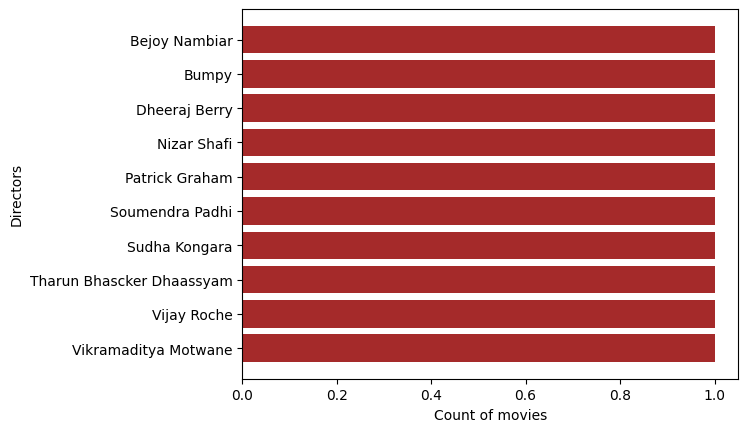

In [ ]:
df_directors = df_india_shows.groupby(['Directors']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending = False)[:15]
df_directors=df_directors[df_directors['Directors']!='Unknown Director']
plt.barh(df_directors[::-1]['Directors'],df_directors[::-1]['title'],color=['brown'])
plt.xlabel('Count of movies')
plt.ylabel('Directors')
plt.show()

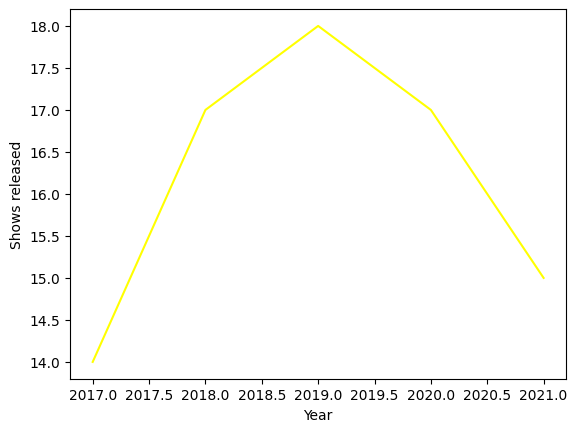

In [ ]:
df_year=df_india_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year,x='year',y='title',color='yellow')
plt.ylabel('Shows released')
plt.xlabel('Year')
plt.show()

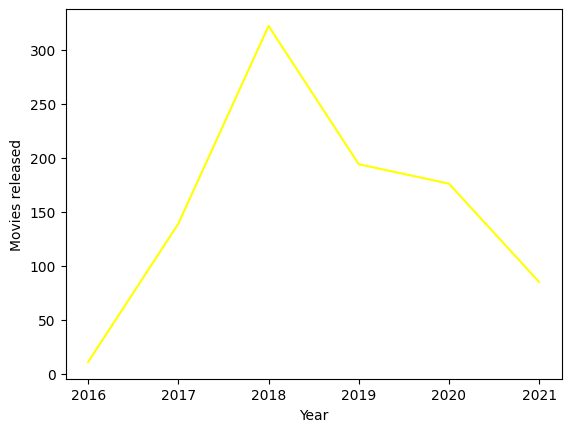

In [ ]:
df_year=df_india_movies.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year,x='year',y='title',color='yellow')
plt.ylabel('Movies released')
plt.xlabel('Year')
plt.show()

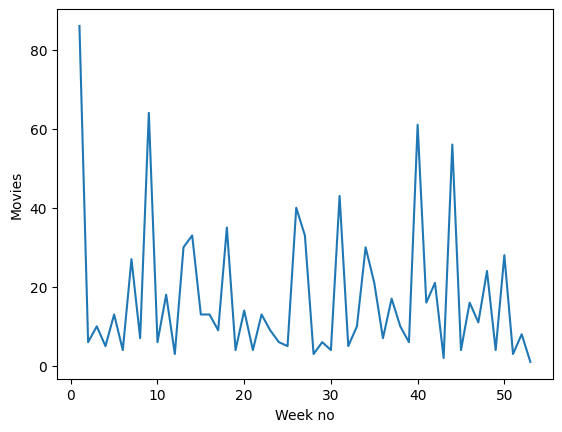

In [ ]:
df_week= df_india_movies.groupby(['week_Added']).agg({'title':'nunique'},ascending=False).reset_index()
sns.lineplot(data=df_week,x='week_Added',y='title')
plt.ylabel('Movies')
plt.xlabel('Week no')
plt.show()

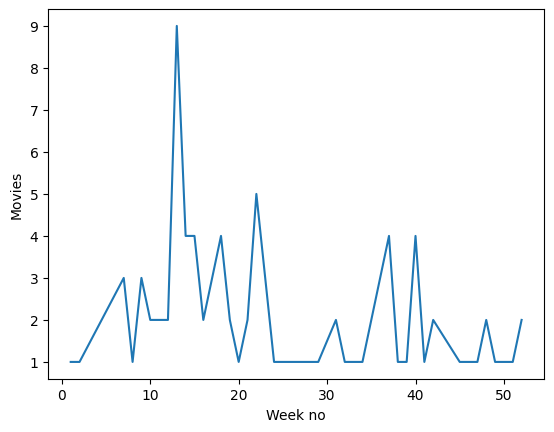

In [ ]:
df_week= df_india_shows.groupby(['week_Added']).agg({'title':'nunique'},ascending=False).reset_index()
sns.lineplot(data=df_week,x='week_Added',y='title')
plt.ylabel('Movies')
plt.xlabel('Week no')
plt.show()

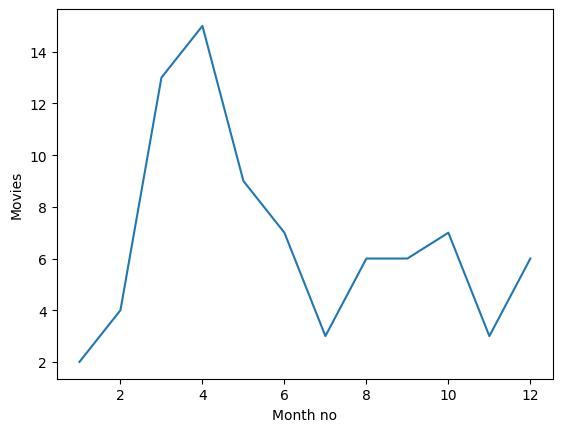

In [ ]:
df_month= df_india_shows.groupby(['month_added']).agg({'title':'nunique'},ascending=False).reset_index()
sns.lineplot(data=df_month,x='month_added',y='title')
plt.ylabel('Movies')
plt.xlabel('Month no')
plt.show()

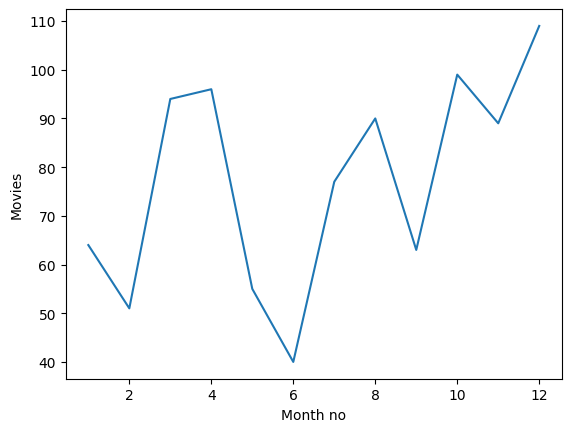

In [ ]:
df_month= df_india_movies.groupby(['month_added']).agg({'title':'nunique'},ascending=False).reset_index()
sns.lineplot(data=df_month,x='month_added',y='title')
plt.ylabel('Movies')
plt.xlabel('Month no')
plt.show()

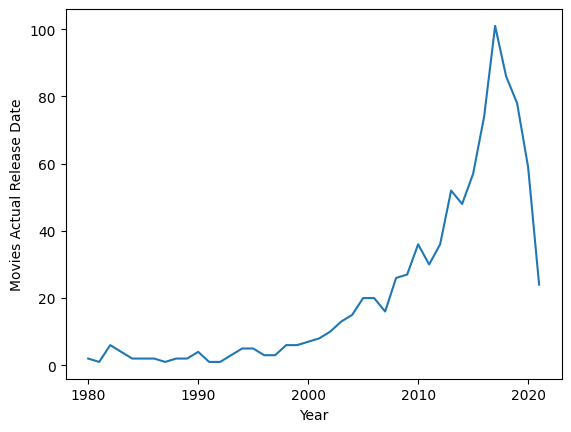

In [ ]:
df_release_year=df_india_movies[df_india_movies['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

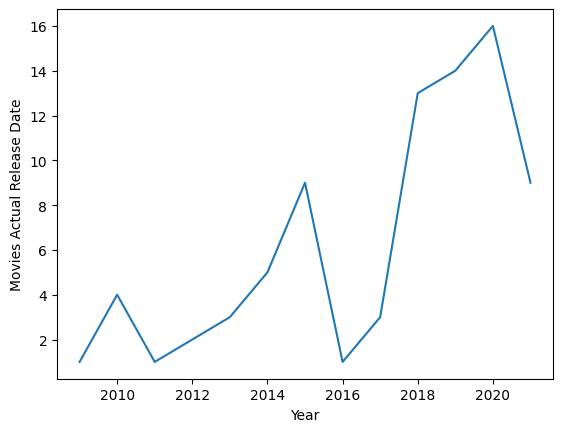

In [ ]:
df_release_year=df_india_shows[df_india_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

In [ ]:
df_india_movies['Actor_Director_Combination'] = df_india_movies.Actors.str.cat(df_india_movies.Directors, sep=' and ')
df_india_movies_subset=df_india_movies[df_india_movies['Actors']!='Unknown Actor']
df_india_movies_subset=df_india_movies_subset[df_india_movies_subset['Directors']!='Unknown Director']
df_india_movies_subset.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
625,Jeans,Prashanth,S. Shankar,Comedies,India,s25,Movie,"September 21, 2021",1998,TV-14,166,166,2021-09-21,9,38,2021,Prashanth and S. Shankar
626,Jeans,Prashanth,S. Shankar,International Movies,India,s25,Movie,"September 21, 2021",1998,TV-14,166,166,2021-09-21,9,38,2021,Prashanth and S. Shankar
627,Jeans,Prashanth,S. Shankar,Romantic Movies,India,s25,Movie,"September 21, 2021",1998,TV-14,166,166,2021-09-21,9,38,2021,Prashanth and S. Shankar
628,Jeans,Aishwarya Rai Bachchan,S. Shankar,Comedies,India,s25,Movie,"September 21, 2021",1998,TV-14,166,166,2021-09-21,9,38,2021,Aishwarya Rai Bachchan and S. Shankar
629,Jeans,Aishwarya Rai Bachchan,S. Shankar,International Movies,India,s25,Movie,"September 21, 2021",1998,TV-14,166,166,2021-09-21,9,38,2021,Aishwarya Rai Bachchan and S. Shankar


In [ ]:
df_india_shows['Actor_Director_Combination'] = df_india_shows.Actors.str.cat(df_india_shows.Directors, sep=' and ')
df_india_shows_subset=df_india_shows[df_india_shows['Actors']!='Unknown Actor']
df_india_shows_subset=df_india_shows_subset[df_india_shows_subset['Directors']!='Unknown Director']
df_india_shows_subset.head()

,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
6677,Navarasa,Suriya,Bejoy Nambiar,TV Shows,India,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,1 Season,2021-08-06,8,31,2021,Suriya and Bejoy Nambiar
6678,Navarasa,Vijay Sethupathi,Bejoy Nambiar,TV Shows,India,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,1 Season,2021-08-06,8,31,2021,Vijay Sethupathi and Bejoy Nambiar
6679,Navarasa,Revathy,Bejoy Nambiar,TV Shows,India,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,1 Season,2021-08-06,8,31,2021,Revathy and Bejoy Nambiar
6680,Navarasa,Prakash Raj,Bejoy Nambiar,TV Shows,India,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,1 Season,2021-08-06,8,31,2021,Prakash Raj and Bejoy Nambiar
6681,Navarasa,Siddarth,Bejoy Nambiar,TV Shows,India,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,1 Season,2021-08-06,8,31,2021,Siddarth and Bejoy Nambiar


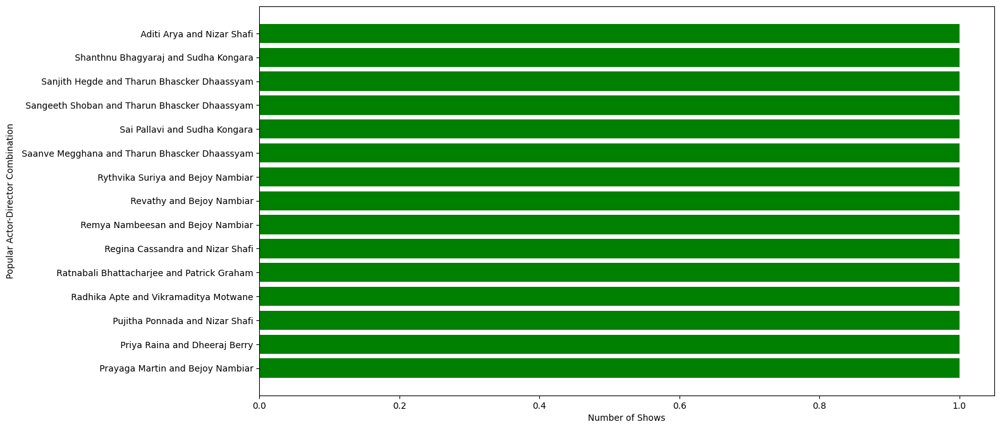

In [ ]:
df_actors_directors=df_india_shows_subset.groupby(['Actor_Director_Combination']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_actors_directors[::-1]['Actor_Director_Combination'], df_actors_directors[::-1]['title'],color=['green'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actor-Director Combination')
plt.show()

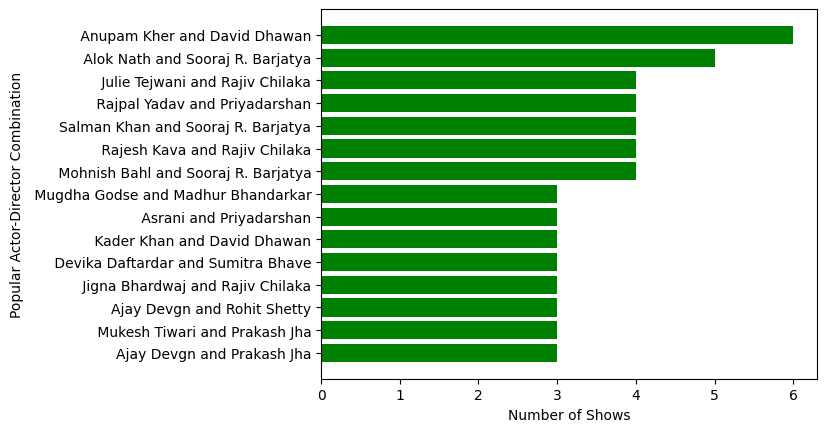

In [ ]:
df_actors_directors=df_india_movies_subset.groupby(['Actor_Director_Combination']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.barh(df_actors_directors[::-1]['Actor_Director_Combination'], df_actors_directors[::-1]['title'],color=['green'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actor-Director Combination')
plt.show()

In [ ]:
# df_india_movies[df_india_movies['Directors']=='Sudha Kongara']
df_india_movies[df_india_movies['Directors']=='Bhagyaraj']


,title,Actors,Directors,Genre,Country,show_id,type,date_added,release_year,rating,duration,duration_copy,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
161590,Papa the Great,Krishan Kumar,Bhagyaraj,Comedies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Krishan Kumar and Bhagyaraj
161591,Papa the Great,Krishan Kumar,Bhagyaraj,Dramas,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Krishan Kumar and Bhagyaraj
161592,Papa the Great,Krishan Kumar,Bhagyaraj,International Movies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Krishan Kumar and Bhagyaraj
161593,Papa the Great,Nagma,Bhagyaraj,Comedies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Nagma and Bhagyaraj
161594,Papa the Great,Nagma,Bhagyaraj,Dramas,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Nagma and Bhagyaraj
161595,Papa the Great,Nagma,Bhagyaraj,International Movies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Nagma and Bhagyaraj
161596,Papa the Great,Satya Prakash,Bhagyaraj,Comedies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Satya Prakash and Bhagyaraj
161597,Papa the Great,Satya Prakash,Bhagyaraj,Dramas,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Satya Prakash and Bhagyaraj
161598,Papa the Great,Satya Prakash,Bhagyaraj,International Movies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Satya Prakash and Bhagyaraj
161599,Papa the Great,Master Bobby,Bhagyaraj,Comedies,India,s7703,Movie,"December 8, 2017",2000,TV-PG,137,137,2017-12-08,12,49,2017,Master Bobby and Bhagyaraj


In [ ]:
df_actors_directors['Actor_Director_Combination'].values

array([' Anupam Kher and David Dhawan',
       ' Alok Nath and Sooraj R. Barjatya',
       ' Julie Tejwani and Rajiv Chilaka',
       ' Rajpal Yadav and Priyadarshan',
       'Salman Khan and Sooraj R. Barjatya',
       ' Rajesh Kava and Rajiv Chilaka',
       ' Mohnish Bahl and Sooraj R. Barjatya',
       ' Mugdha Godse and Madhur Bhandarkar', ' Asrani and Priyadarshan',
       ' Kader Khan and David Dhawan',
       ' Devika Daftardar and Sumitra Bhave',
       ' Jigna Bhardwaj and Rajiv Chilaka', 'Ajay Devgn and Rohit Shetty',
       ' Mukesh Tiwari and Prakash Jha', 'Ajay Devgn and Prakash Jha'],
      dtype=object)